# Problem Statement

BigMart, a retail giant, has provided a dataset containing sales data for 1559 products across 10 stores in different cities, with attributes defined for each product and store. The objective of this data science project is to build a predictive model to estimate the sales of each product at a specific store. The model's insights will help BigMart understand the key properties of products and stores influencing sales, facilitating strategic decisions to boost revenue

# Hypothesis Generation

After analysing the market and the csv provided here are our hyporthesis : 

### Geographical Location:
A store's geographic location may have a big influence on the kind of products that customers choose to buy. Sales may differ based on the area or city ('Tier 1', 'Tier 2', or 'Tier 3' cities).

#### Item Visibility: 
Products with higher visibility might have higher sales, assuming that customers are more likely to purchase prominently displayed items.


#### Store Size:
It stands to reason that a store's physical dimensions have an impact on sales. Bigger retailers may draw in more consumers and provide a wider range of goods.

#### Discounts and Promotions: 
Regular discounts or promotions may increase sales. It is hypothesized that when there are reductions, customers are more likely to make purchases.

    
#### Product Characteristics:  
Specific product attributes such as brand, category, or distinctive features could influence sales. more specifically :

#### Item Weight:
 Products with higher weights may have higher prices, assuming a positive correlation between weight and manufacturing costs.
 
#### Item Fat_Content:
 Items labeled as 'Low Fat' might be perceived as healthier, potentially leading to higher sales compared to 'Regular' fat content items.

#### Seasons and Special Events: 
Depending on the time of year or the presence of special events, sales may fluctuate. For example, rises during the holidays.

#### Customer Experience:
A store's overall impression on a customer's purchasing behavior may be influenced by factors like cleanliness, friendliness, and ease of navigation.

#### Product Types: 
Sales trends for various product types may differ. Food products, for instance, may differ from electronic products in certain ways: 

#### Local Economy:
The state of the local economy may also be important. A strong economy, for instance, might encourage consumer spending.
Opening Hours: Given that longer hours are likely to draw in more clients, the store's opening hours may have an effect on sales.

#### Stock Availability: 
Keeping a steady stream of sales may depend on the regular availability of products in stock.

#### Brand Effects: 
How sales are impacted by brand awareness. Well-known brands may draw in more clients.
#### Technological Development: 
The use of advanced technologies in the store, such as modern payment systems, could enhance the shopping experience and influence sales.

#### Strong Publicity: 
Products that receive strong or extensive publicity campaigns might experience increased visibility and consumer awareness. This heightened awareness could potentially translate into higher sales compared to products with less publicity.

    

# Import data


In [7]:
import numpy as np
import pandas as pd
import pickle
import matplotlib.pyplot as plt
import seaborn as sns 
from sklearn.preprocessing import MinMaxScaler



In [194]:
train_csv = pd.read_csv('Train.csv')
train_csv.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,NaN,Tier 3,Grocery Store,732.3800
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052


 # What Item_Fat_Content has the best number of sales

In [195]:
result = train_csv[['Item_Fat_Content', 'Item_Outlet_Sales']].groupby('Item_Fat_Content').sum()
print(result)

                  Item_Outlet_Sales
Item_Fat_Content                   
LF                     6.552424e+05
Low Fat                1.101503e+07
Regular                6.457454e+06
low fat                2.338270e+05
reg                    2.295765e+05


In [196]:
# Replace variations of 'Item_Fat_Content' with 'Low Fat'
train_csv['Item_Fat_Content'] = train_csv['Item_Fat_Content'].replace(['LF', 'low fat'], 'Low Fat')
train_csv['Item_Fat_Content'] = train_csv['Item_Fat_Content'].replace('reg', 'Regular')

# Verify the changes
print(train_csv['Item_Fat_Content'].unique())

['Low Fat' 'Regular']


In [97]:
result = train_csv[['Item_Fat_Content', 'Item_Outlet_Sales']].groupby('Item_Fat_Content').sum()
print(result)

                  Item_Outlet_Sales
Item_Fat_Content                   
Low Fat                1.190409e+07
Regular                6.687031e+06


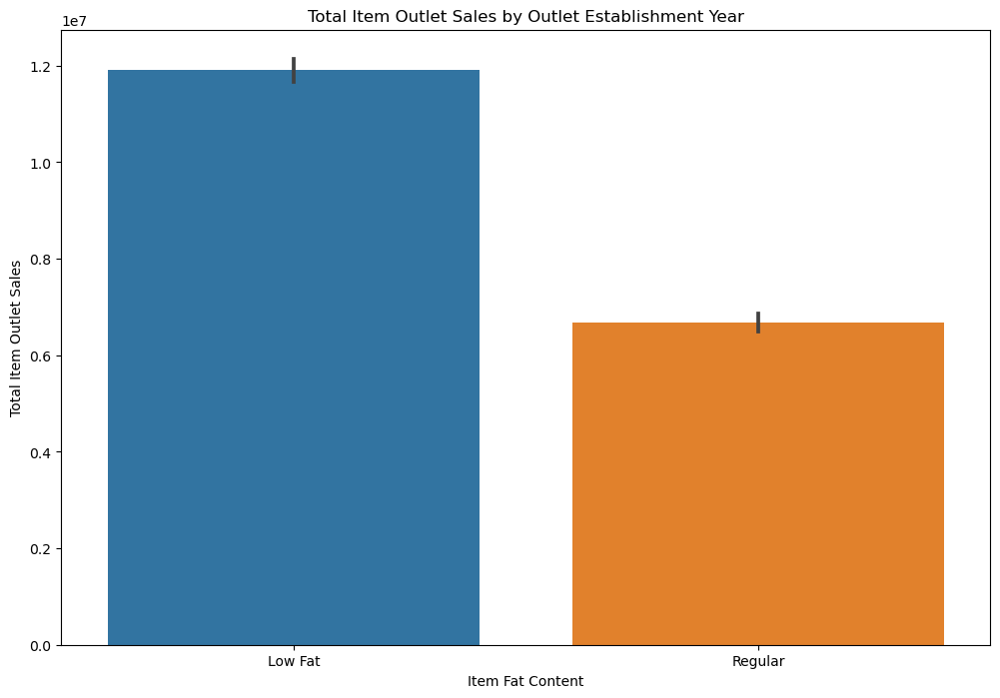

In [100]:
# Create a bar plot for Item_Outlet_Sales based on Outlet_Establishment_Year
plt.figure(figsize=(12, 8))
sns.barplot(x='Item_Fat_Content', y='Item_Outlet_Sales', data=train_csv, estimator=sum)

# Customize the plot
plt.title('Total Item Outlet Sales by Outlet Establishment Year')
plt.xlabel('Item Fat Content')
plt.ylabel('Total Item Outlet Sales')

plt.show()

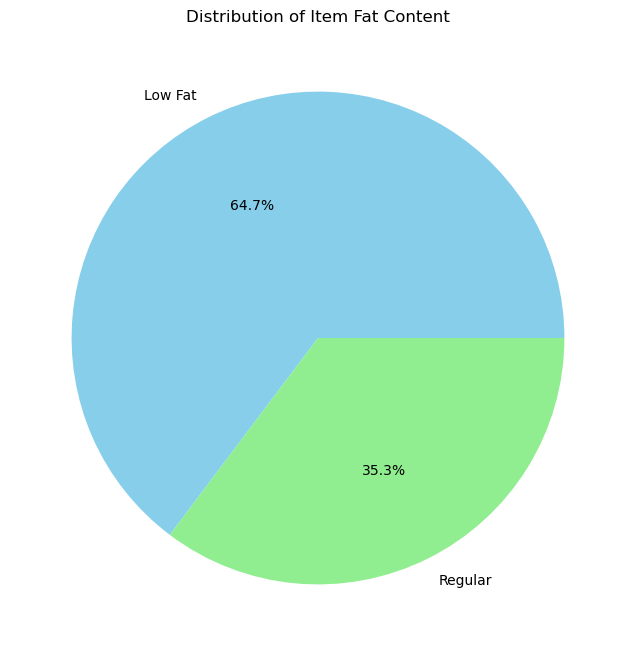

In [214]:
train_csv['Item_Fat_Content'] = train_csv['Item_Fat_Content'].replace({'LF': 'Low Fat', 'low fat': 'Low Fat'})

# Get the updated counts
fat_content_counts = train_csv['Item_Fat_Content'].value_counts()

# Create a pie chart with percentages
plt.figure(figsize=(8, 8))
plt.pie(fat_content_counts, labels=fat_content_counts.index, autopct='%1.1f%%', startangle=0, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Item Fat Content')
plt.show()

In [98]:
transposed_df = train_csv.transpose()
transposed_df.head()

,0,1,2,3,4,5,6,7,8,9,...,8513,8514,8515,8516,8517,8518,8519,8520,8521,8522
Item_Identifier,FDA15,DRC01,FDN15,FDX07,NCD19,FDP36,FDO10,FDP10,FDH17,FDU28,...,FDH31,FDA01,FDH24,NCJ19,FDF53,FDF22,FDS36,NCJ29,FDN46,DRG01
Item_Weight,9.3,5.92,17.5,19.2,8.93,10.395,13.65,NaN,16.2,19.2,...,12.0,15.0,20.7,18.6,20.75,6.865,8.38,10.6,7.21,14.8
Item_Fat_Content,Low Fat,Regular,Low Fat,Regular,Low Fat,Regular,Regular,Low Fat,Regular,Regular,...,Regular,Regular,Low Fat,Low Fat,Regular,Low Fat,Regular,Low Fat,Regular,Low Fat
Item_Visibility,0.016047,0.019278,0.01676,0.0,0.0,0.0,0.012741,0.12747,0.016687,0.09445,...,0.020407,0.054489,0.021518,0.118661,0.083607,0.056783,0.046982,0.035186,0.145221,0.044878
Item_Type,Dairy,Soft Drinks,Meat,Fruits and Vegetables,Household,Baking Goods,Snack Foods,Snack Foods,Frozen Foods,Frozen Foods,...,Meat,Canned,Baking Goods,Others,Frozen Foods,Snack Foods,Baking Goods,Health and Hygiene,Snack Foods,Soft Drinks


In [102]:
sorted_sales = train_csv.sort_values(by='Item_Outlet_Sales', ascending=False)
sorted_sales.tail()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
7388,FDQ47,7.155,Regular,0.281510,Breads,33.8874,OUT010,1998,NaN,Tier 3,Grocery Store,35.2874
3053,NCL41,NaN,Low Fat,0.073077,Health and Hygiene,34.3216,OUT019,1985,Small,Tier 1,Grocery Store,34.6216
2571,FDU21,NaN,Regular,0.134328,Snack Foods,35.0558,OUT019,1985,Small,Tier 1,Grocery Store,33.9558
6950,NCR42,9.105,Low Fat,0.064411,Household,33.3900,OUT010,1998,NaN,Tier 3,Grocery Store,33.2900
906,DRK12,9.500,Low Fat,0.000000,Soft Drinks,32.8900,OUT010,1998,NaN,Tier 3,Grocery Store,33.2900


# handeling missing values

In [103]:
train_csv.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [104]:
print("Before Imputation:")
print(train_csv.info())

# Create an imputer for 'Item_Weight' using mean strategy
imputer_weight = SimpleImputer(strategy='mean')
train_csv['Item_Weight'] = imputer_weight.fit_transform(train_csv[['Item_Weight']])

# Create an imputer for 'Outlet_Size' using the most frequent strategy (mode)
imputer_size = SimpleImputer(strategy='most_frequent')
train_csv['Outlet_Size'] = imputer_size.fit_transform(train_csv[['Outlet_Size']])

# Verify that missing values have been imputed
print("\nAfter Imputation:")
print(train_csv.info())

Before Imputation:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8523 entries, 0 to 8522
Data columns (total 12 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Item_Identifier            8523 non-null   object 
 1   Item_Weight                7060 non-null   float64
 2   Item_Fat_Content           8523 non-null   object 
 3   Item_Visibility            8523 non-null   float64
 4   Item_Type                  8523 non-null   object 
 5   Item_MRP                   8523 non-null   float64
 6   Outlet_Identifier          8523 non-null   object 
 7   Outlet_Establishment_Year  8523 non-null   int64  
 8   Outlet_Size                6113 non-null   object 
 9   Outlet_Location_Type       8523 non-null   object 
 10  Outlet_Type                8523 non-null   object 
 11  Item_Outlet_Sales          8523 non-null   float64
dtypes: float64(4), int64(1), object(7)
memory usage: 799.2+ KB
None

After Imputation:
<c

In [105]:
train_csv.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

# What Year we had the highest numer of sales

In [109]:
train_csv.columns = train_csv.columns.str.strip()

# Group by 'Outlet_Establishment_Year' and sum 'Item_Outlet_Sales'
result = train_csv[['Outlet_Establishment_Year', 'Item_Outlet_Sales']].groupby('Outlet_Establishment_Year').sum()
print(result)

                           Item_Outlet_Sales
Outlet_Establishment_Year                   
1985                            3.633620e+06
1987                            2.142664e+06
1997                            2.118395e+06
1998                            1.883402e+05
1999                            2.183970e+06
2002                            2.036725e+06
2004                            2.268123e+06
2007                            2.167465e+06
2009                            1.851823e+06


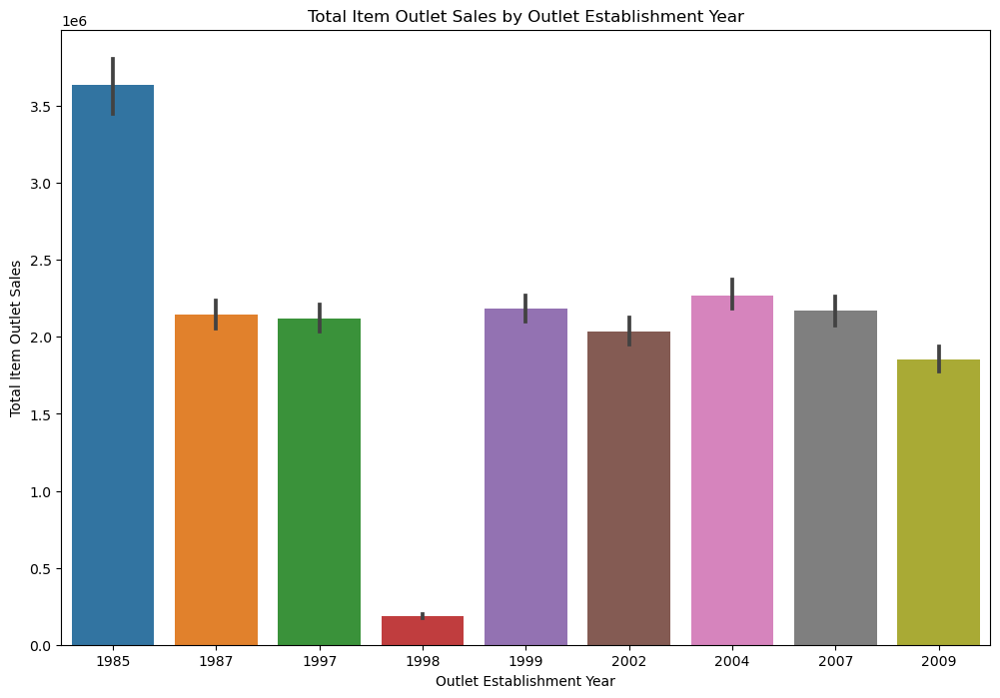

In [111]:
# Create a bar plot for Item_Outlet_Sales based on Outlet_Establishment_Year
plt.figure(figsize=(12, 8))
sns.barplot(x='Outlet_Establishment_Year', y='Item_Outlet_Sales', data=train_csv, estimator=sum)

# Customize the plot
plt.title('Total Item Outlet Sales by Outlet Establishment Year')
plt.xlabel('Outlet Establishment Year')
plt.ylabel('Total Item Outlet Sales')

plt.show()

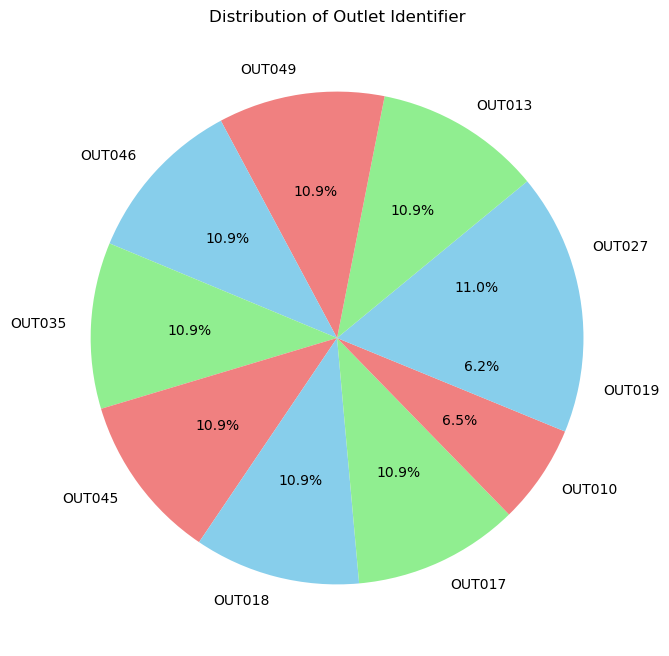

In [220]:
train_csv['Outlet_Identifier'] = train_csv['Outlet_Identifier'].replace({'LF': 'Low Fat', 'low fat': 'Low Fat'})

# Get the updated counts
fat_content_counts = train_csv['Outlet_Identifier'].value_counts()

# Create a pie chart with percentages
plt.figure(figsize=(8, 8))
plt.pie(fat_content_counts, labels=fat_content_counts.index, autopct='%1.1f%%', startangle=0, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Outlet Identifier')
plt.show()

# What Item type we had the highest numer of sales

In [112]:


train_csv.columns = train_csv.columns.str.strip()

# Group by 'Outlet_Establishment_Year' and sum 'Item_Outlet_Sales'
result = train_csv[['Item_Type', 'Item_Outlet_Sales']].groupby('Item_Type').sum()
print(result)

                       Item_Outlet_Sales
Item_Type                               
Baking Goods                1.265525e+06
Breads                      5.532372e+05
Breakfast                   2.322990e+05
Canned                      1.444151e+06
Dairy                       1.522594e+06
Frozen Foods                1.825735e+06
Fruits and Vegetables       2.820060e+06
Hard Drinks                 4.577934e+05
Health and Hygiene          1.045200e+06
Household                   2.055494e+06
Meat                        9.175656e+05
Others                      3.255176e+05
Seafood                     1.488682e+05
Snack Foods                 2.732786e+06
Soft Drinks                 8.928977e+05
Starchy Foods               3.514013e+05


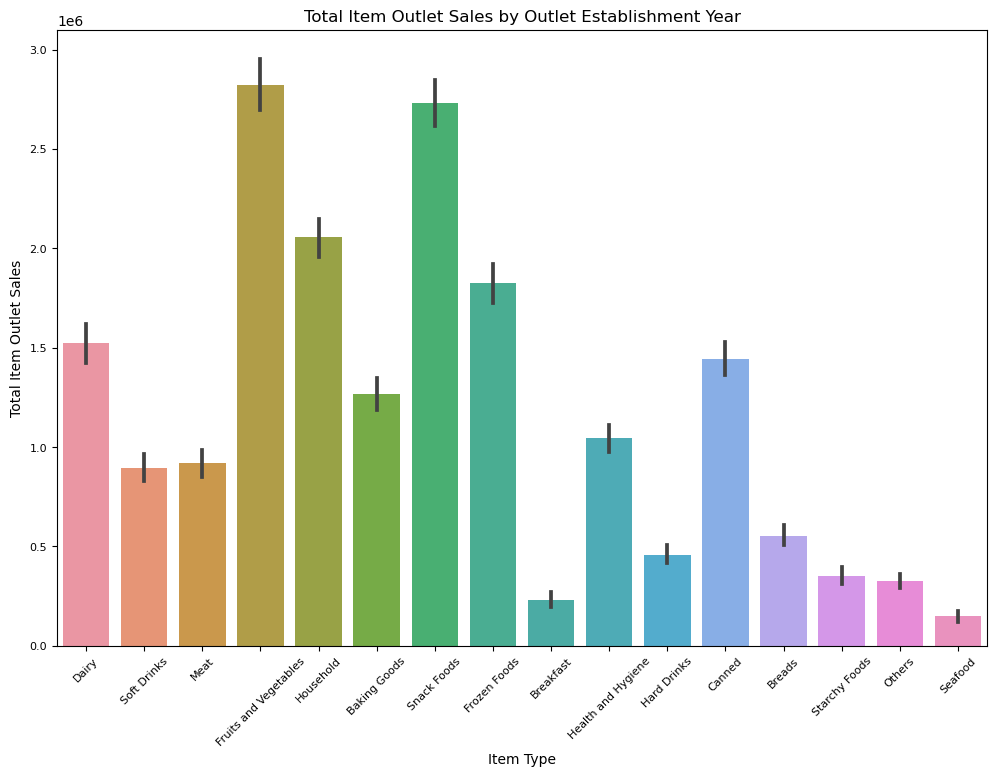

In [216]:

# Create a bar plot for Item_Outlet_Sales based on Outlet_Establishment_Year
plt.figure(figsize=(12, 8))
sns.barplot(x='Item_Type', y='Item_Outlet_Sales', data=train_csv, estimator=sum)

# Customize the plot with smaller font size
plt.title('Total Item Outlet Sales by Outlet Establishment Year', fontsize=12)
plt.xlabel('Item Type', fontsize=10)
plt.ylabel('Total Item Outlet Sales', fontsize=10)
plt.xticks(fontsize=8, rotation=45)  # Rotate x-axis labels
plt.yticks(fontsize=8)

plt.show()

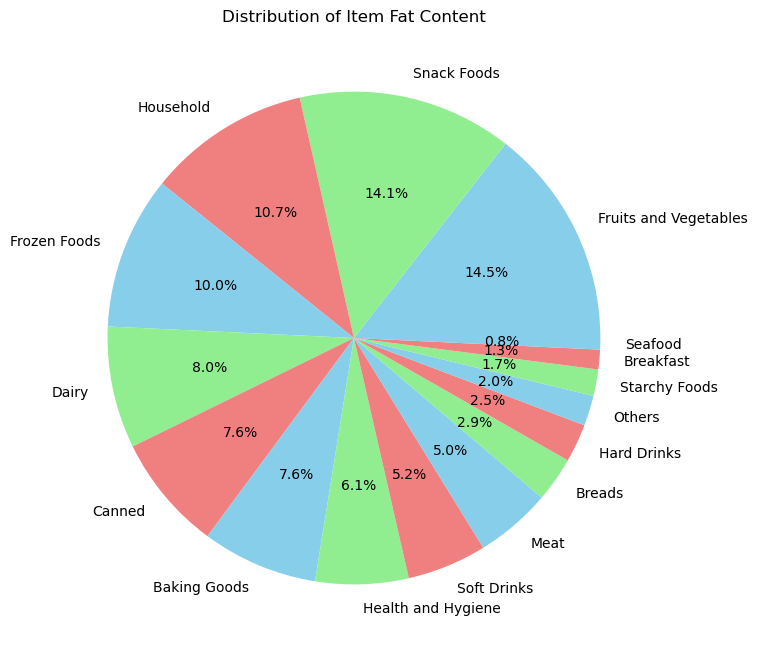

In [217]:
train_csv['Item_Type'] = train_csv['Item_Type'].replace({'LF': 'Low Fat', 'low fat': 'Low Fat'})

# Get the updated counts
fat_content_counts = train_csv['Item_Type'].value_counts()

# Create a pie chart with percentages
plt.figure(figsize=(8, 8))
plt.pie(fat_content_counts, labels=fat_content_counts.index, autopct='%1.1f%%', startangle=0, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Item Fat Content')
plt.show()

# What Outlet_Size  we had the highest numer of sales

In [119]:

train_csv.columns = train_csv.columns.str.strip()

# Group by 'Outlet_Establishment_Year' and sum 'Item_Outlet_Sales'
result = train_csv[['Outlet_Size', 'Item_Outlet_Sales']].groupby('Outlet_Size').sum()
print(result)

             Item_Outlet_Sales
Outlet_Size                   
High              2.142664e+06
Medium            7.489719e+06
Small             4.566212e+06


# What Outlet_Location_Type  we had the highest numer of sales 

In [121]:

train_csv.columns = train_csv.columns.str.strip()

# Group by 'Outlet_Establishment_Year' and sum 'Item_Outlet_Sales'
result = train_csv[['Outlet_Location_Type', 'Item_Outlet_Sales']].groupby('Outlet_Location_Type').sum()
print(result)

                      Item_Outlet_Sales
Outlet_Location_Type                   
Tier 1                     4.482059e+06
Tier 2                     6.472314e+06
Tier 3                     7.636753e+06


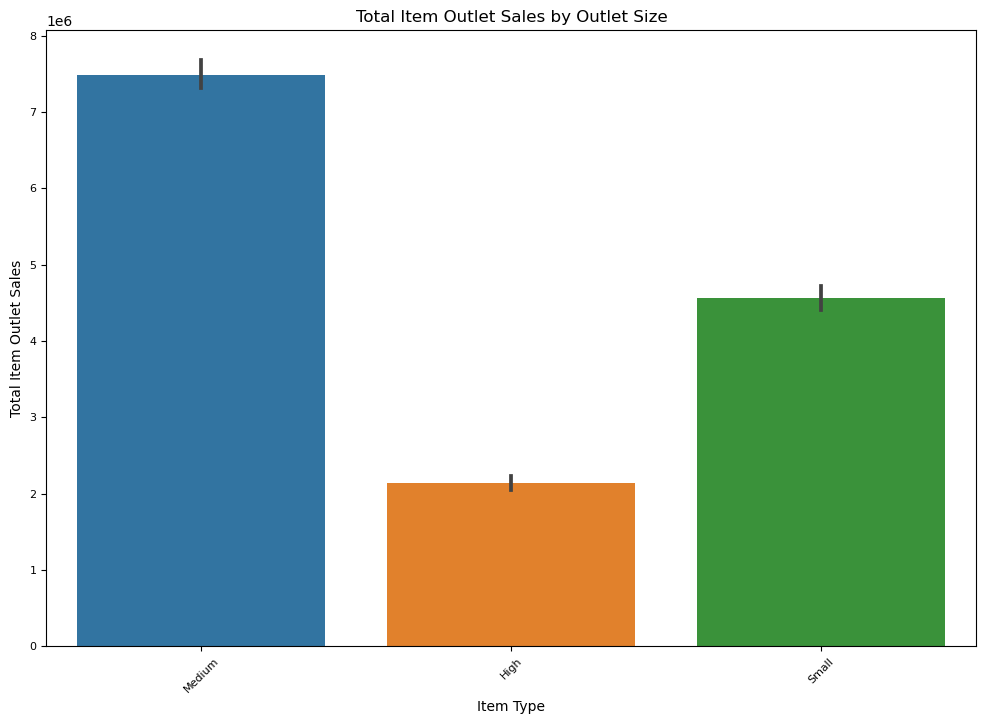

In [219]:
# Create a bar plot for Item_Outlet_Sales based on Outlet_Establishment_Year
plt.figure(figsize=(12, 8))
sns.barplot(x='Outlet_Size', y='Item_Outlet_Sales', data=train_csv, estimator=sum)

# Customize the plot with smaller font size
plt.title('Total Item Outlet Sales by Outlet Size', fontsize=12)
plt.xlabel('Item Type', fontsize=10)
plt.ylabel('Total Item Outlet Sales', fontsize=10)
plt.xticks(fontsize=8, rotation=45)  # Rotate x-axis labels
plt.yticks(fontsize=8)

plt.show()

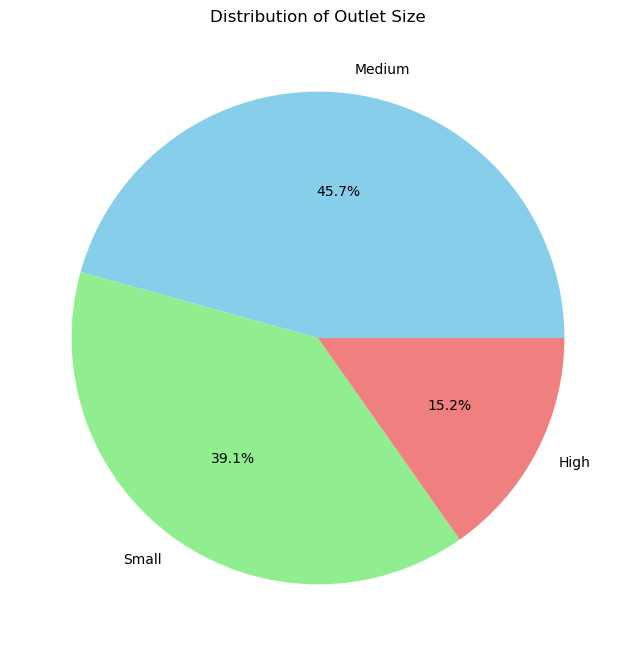

In [218]:
train_csv['Outlet_Size'] = train_csv['Outlet_Size'].replace({'LF': 'Low Fat', 'low fat': 'Low Fat'})

# Get the updated counts
fat_content_counts = train_csv['Outlet_Size'].value_counts()

# Create a pie chart with percentages
plt.figure(figsize=(8, 8))
plt.pie(fat_content_counts, labels=fat_content_counts.index, autopct='%1.1f%%', startangle=0, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Outlet Size')
plt.show()

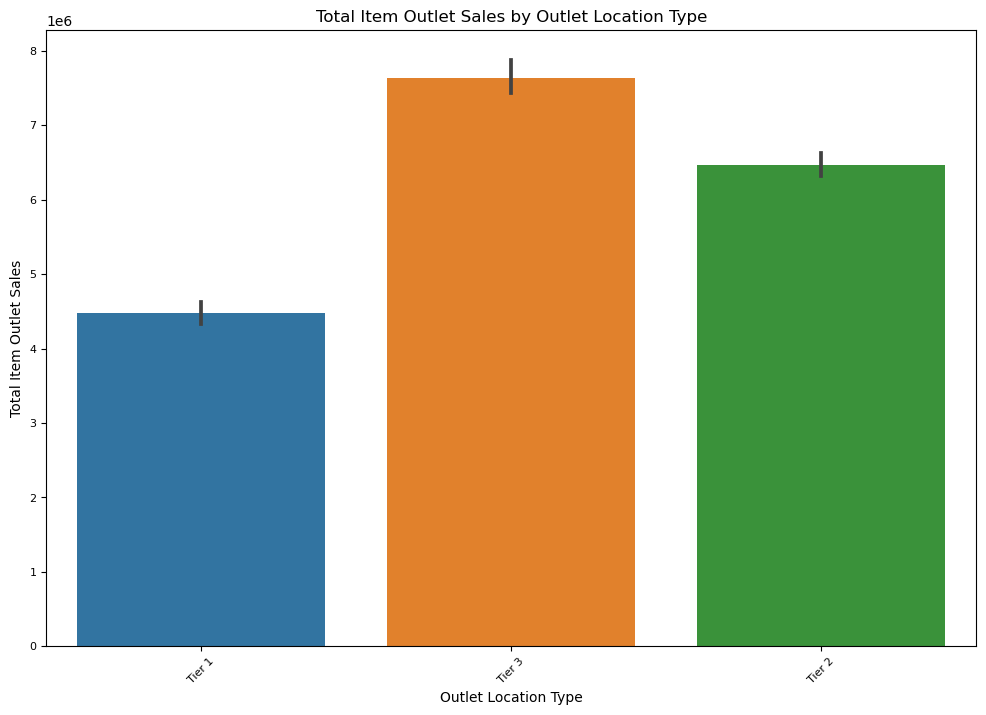

In [122]:


# Create a bar plot for Item_Outlet_Sales based on Outlet_Establishment_Year
plt.figure(figsize=(12, 8))
sns.barplot(x='Outlet_Location_Type', y='Item_Outlet_Sales', data=train_csv, estimator=sum)

# Customize the plot with smaller font size
plt.title('Total Item Outlet Sales by Outlet Location Type', fontsize=12)
plt.xlabel('Outlet Location Type', fontsize=10)
plt.ylabel('Total Item Outlet Sales', fontsize=10)
plt.xticks(fontsize=8, rotation=45)  # Rotate x-axis labels
plt.yticks(fontsize=8)

plt.show()


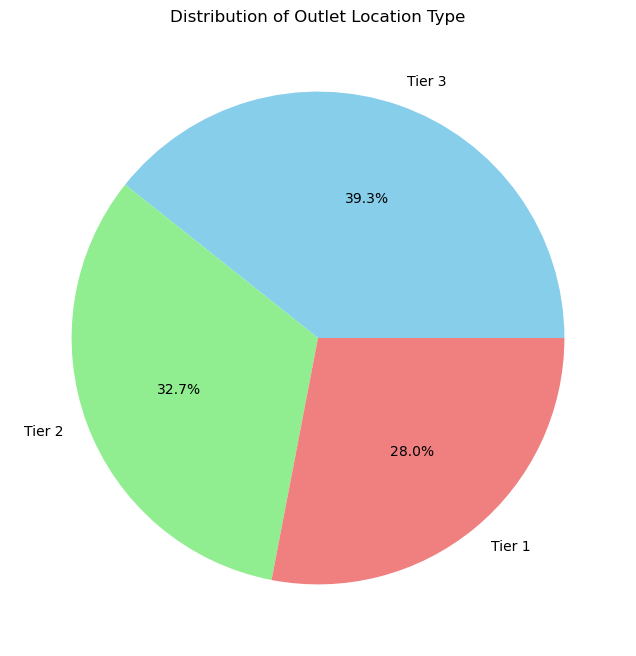

In [221]:
train_csv['Outlet_Location_Type'] = train_csv['Outlet_Location_Type'].replace({'LF': 'Low Fat', 'low fat': 'Low Fat'})

# Get the updated counts
fat_content_counts = train_csv['Outlet_Location_Type'].value_counts()

# Create a pie chart with percentages
plt.figure(figsize=(8, 8))
plt.pie(fat_content_counts, labels=fat_content_counts.index, autopct='%1.1f%%', startangle=0, colors=['skyblue', 'lightgreen', 'lightcoral'])
plt.title('Distribution of Outlet Location Type')
plt.show()

# What Outlet Type we had the highest numer of sales

In [124]:

train_csv.columns = train_csv.columns.str.strip()

# Group by 'Outlet_Establishment_Year' and sum 'Item_Outlet_Sales'
result = train_csv[['Outlet_Type', 'Item_Outlet_Sales']].groupby('Outlet_Type').sum()
print(result)

                   Item_Outlet_Sales
Outlet_Type                         
Grocery Store           3.680343e+05
Supermarket Type1       1.291734e+07
Supermarket Type2       1.851823e+06
Supermarket Type3       3.453926e+06


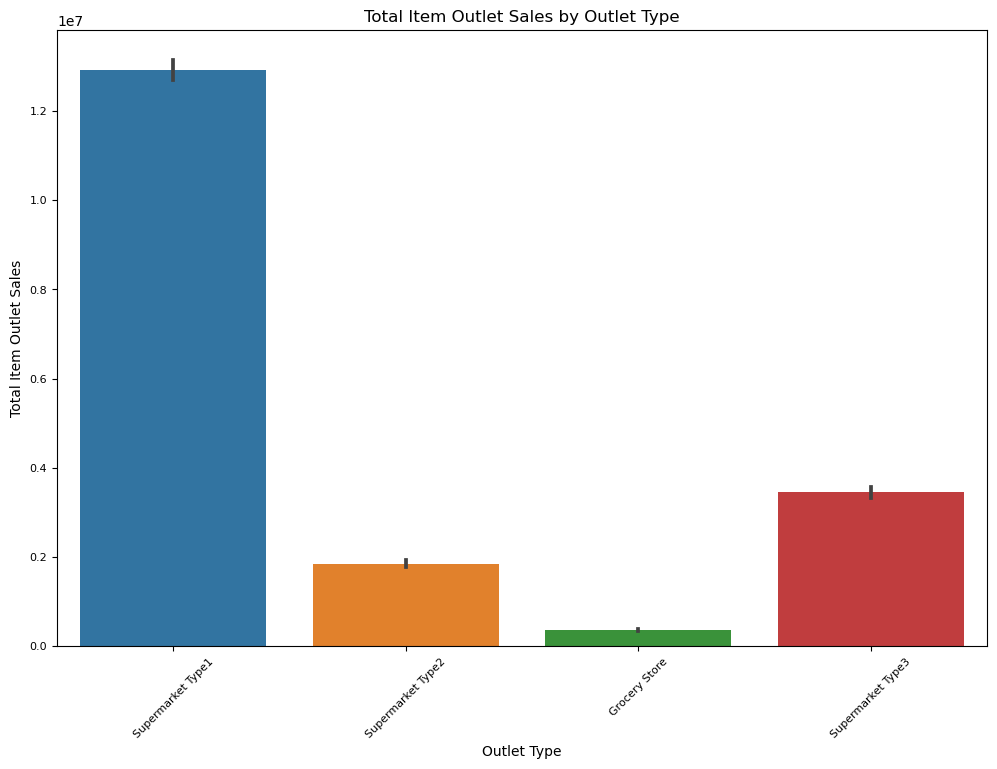

In [127]:

# Create a bar plot for Item_Outlet_Sales based on Outlet_Establishment_Year
plt.figure(figsize=(12, 8))
sns.barplot(x='Outlet_Type', y='Item_Outlet_Sales', data=train_csv, estimator=sum)

# Customize the plot with smaller font size
plt.title('Total Item Outlet Sales by Outlet Type', fontsize=12)
plt.xlabel('Outlet Type', fontsize=10)
plt.ylabel('Total Item Outlet Sales', fontsize=10)
plt.xticks(fontsize=8, rotation=45)  # Rotate x-axis labels
plt.yticks(fontsize=8)

plt.show()

# What Outlet Identifier we had the highest numer of sales

In [141]:

train_csv.columns = train_csv.columns.str.strip()

# Group by 'Outlet_Establishment_Year' and sum 'Item_Outlet_Sales'
result = train_csv[['Outlet_Identifier', 'Item_Outlet_Sales']].groupby('Outlet_Identifier').sum()
print(result)

                   Item_Outlet_Sales
Outlet_Identifier                   
OUT010                  1.883402e+05
OUT013                  2.142664e+06
OUT017                  2.167465e+06
OUT018                  1.851823e+06
OUT019                  1.796941e+05
OUT027                  3.453926e+06
OUT035                  2.268123e+06
OUT045                  2.036725e+06
OUT046                  2.118395e+06
OUT049                  2.183970e+06


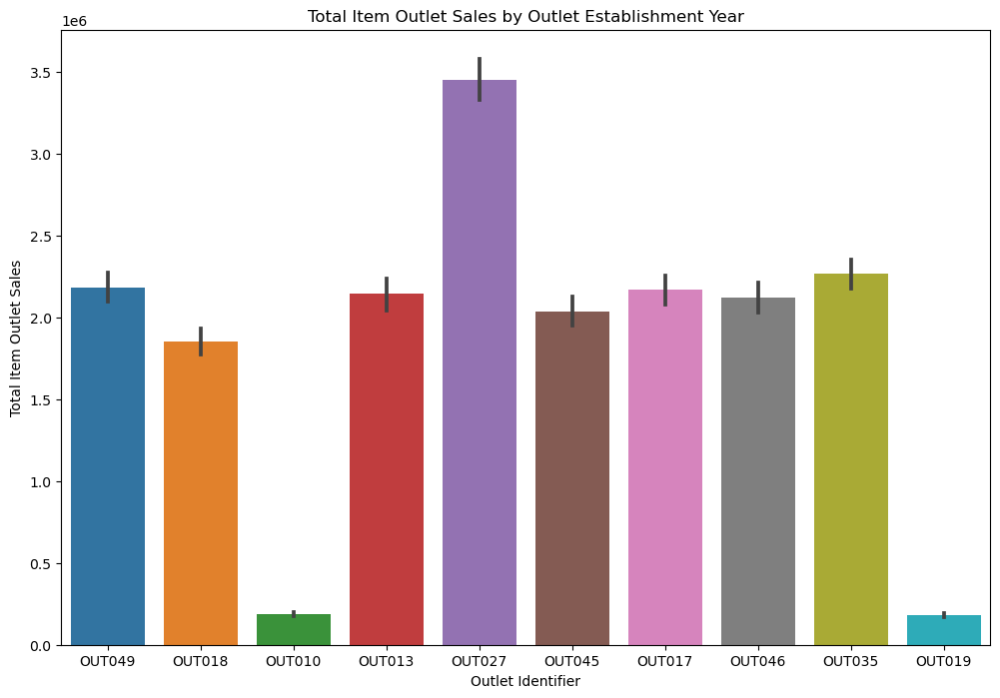

In [142]:

# Create a bar plot for Item_Outlet_Sales based on Outlet_Establishment_Year
plt.figure(figsize=(12, 8))
sns.barplot(x='Outlet_Identifier', y='Item_Outlet_Sales', data=train_csv, estimator=sum)

# Customize the plot
plt.title('Total Item Outlet Sales by Outlet Establishment Year')
plt.xlabel('Outlet Identifier')
plt.ylabel('Total Item Outlet Sales')

plt.show()

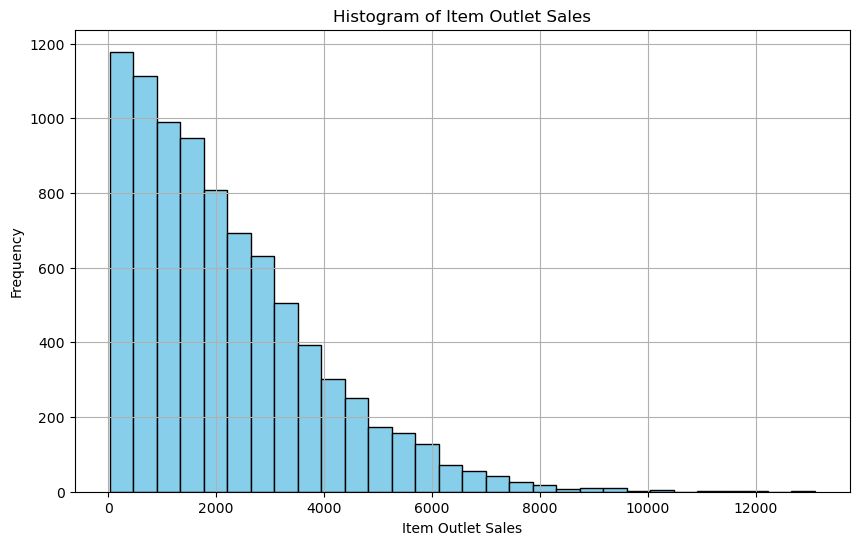

In [106]:
# Plotting a Histogram
plt.figure(figsize=(10, 6))
plt.hist(train_csv['Item_Outlet_Sales'], bins=30, color='skyblue', edgecolor='black')
plt.title('Histogram of Item Outlet Sales')
plt.xlabel('Item Outlet Sales')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

# plotting a scatter for the item MRP

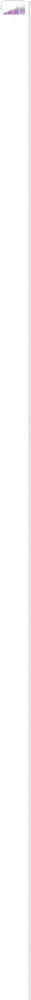

In [107]:
# Plotting a Scatter Plot
train_csv = pd.read_csv('Train.csv')

# Set a color palette with unique colors for each item
item_colors = sns.color_palette('husl', n_colors=len(train_csv['Item_Identifier'].unique()))

# Create a dictionary to map Item_Identifier to colors
item_color_dict = dict(zip(train_csv['Item_Identifier'].unique(), item_colors))

# Plotting a Scatter Plot with different colors for each item
plt.figure(figsize=(10, 6))

for item, color in item_color_dict.items():
    item_data = train_csv[train_csv['Item_Identifier'] == item]
    plt.scatter(item_data['Item_MRP'], item_data['Item_Outlet_Sales'], alpha=0.5, label=item, color=color)

plt.title('Scatter Plot of Item MRP vs. Item Outlet Sales (Each Item in a Different Color)')
plt.xlabel('Item MRP')
plt.ylabel('Item Outlet Sales')
plt.legend(title='Item Identifier', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# plotting a scatter for the item weight 

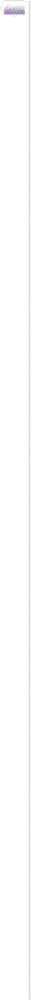

In [189]:
# Plotting a Scatter Plot
train_csv = pd.read_csv('Train.csv')

# Set a color palette with unique colors for each item
item_colors = sns.color_palette('husl', n_colors=len(train_csv['Item_Identifier'].unique()))

# Create a dictionary to map Item_Identifier to colors
item_color_dict = dict(zip(train_csv['Item_Identifier'].unique(), item_colors))

# Plotting a Scatter Plot with different colors for each item
plt.figure(figsize=(10, 6))

for item, color in item_color_dict.items():
    item_data = train_csv[train_csv['Item_Identifier'] == item]
    plt.scatter(item_data['Item_Weight'], item_data['Item_Outlet_Sales'], alpha=0.5, label=item, color=color)

plt.title('Scatter Plot of Item MRP vs. Item Outlet Sales (Each Item in a Different Color)')
plt.xlabel('Item Weight')
plt.ylabel('Item Outlet Sales')
plt.legend(title='Item Identifier', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# plotting a scatter for Item Visibility

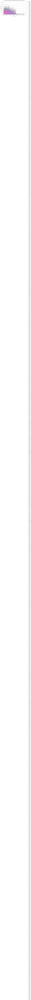

In [190]:
# Plotting a Scatter Plot
train_csv = pd.read_csv('Train.csv')

# Set a color palette with unique colors for each item
item_colors = sns.color_palette('husl', n_colors=len(train_csv['Item_Identifier'].unique()))

# Create a dictionary to map Item_Identifier to colors
item_color_dict = dict(zip(train_csv['Item_Identifier'].unique(), item_colors))

# Plotting a Scatter Plot with different colors for each item
plt.figure(figsize=(10, 6))

for item, color in item_color_dict.items():
    item_data = train_csv[train_csv['Item_Identifier'] == item]
    plt.scatter(item_data['Item_Visibility'], item_data['Item_Outlet_Sales'], alpha=0.5, label=item, color=color)

plt.title('Scatter Plot of Item MRP vs. Item Outlet Sales (Each Item in a Different Color)')
plt.xlabel('Item Visibility')
plt.ylabel('Item Outlet Sales')
plt.legend(title='Item Identifier', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.grid(True)
plt.show()

# let's see a Summary of Frequency Distribution for Categories in the Store Dataset

In [132]:
colonnes_a_analyser = ['Item_Type']

# Générer des tables de fréquence pour chaque colonne
for colonne in colonnes_a_analyser:
    table_de_frequence = train_csv[colonne].value_counts()
    print(f"\nTable de fréquence pour {colonne} :")
    print(table_de_frequence)



Table de fréquence pour Item_Type :
Fruits and Vegetables    1232
Snack Foods              1200
Household                 910
Frozen Foods              856
Dairy                     682
Canned                    649
Baking Goods              648
Health and Hygiene        520
Soft Drinks               445
Meat                      425
Breads                    251
Hard Drinks               214
Others                    169
Starchy Foods             148
Breakfast                 110
Seafood                    64
Name: Item_Type, dtype: int64


In [133]:
colonnes_a_analyser = ['Outlet_Location_Type']

# Générer des tables de fréquence pour chaque colonne
for colonne in colonnes_a_analyser:
    table_de_frequence = train_csv[colonne].value_counts()
    print(f"\nTable de fréquence pour {colonne} :")
    print(table_de_frequence)


Table de fréquence pour Outlet_Location_Type :
Tier 3    3350
Tier 2    2785
Tier 1    2388
Name: Outlet_Location_Type, dtype: int64


In [134]:
colonnes_a_analyser = ['Outlet_Type']

# Générer des tables de fréquence pour chaque colonne
for colonne in colonnes_a_analyser:
    table_de_frequence = train_csv[colonne].value_counts()
    print(f"\nTable de fréquence pour {colonne} :")
    print(table_de_frequence)


Table de fréquence pour Outlet_Type :
Supermarket Type1    5577
Grocery Store        1083
Supermarket Type3     935
Supermarket Type2     928
Name: Outlet_Type, dtype: int64


In [135]:
colonnes_a_analyser = ['Outlet_Establishment_Year']

# Générer des tables de fréquence pour chaque colonne
for colonne in colonnes_a_analyser:
    table_de_frequence = train_csv[colonne].value_counts()
    print(f"\nTable de fréquence pour {colonne} :")
    print(table_de_frequence)


Table de fréquence pour Outlet_Establishment_Year :
1985    1463
1987     932
1999     930
1997     930
2004     930
2002     929
2009     928
2007     926
1998     555
Name: Outlet_Establishment_Year, dtype: int64


In [136]:
colonnes_a_analyser = ['Outlet_Identifier']

# Générer des tables de fréquence pour chaque colonne
for colonne in colonnes_a_analyser:
    table_de_frequence = train_csv[colonne].value_counts()
    print(f"\nTable de fréquence pour {colonne} :")
    print(table_de_frequence)


Table de fréquence pour Outlet_Identifier :
OUT027    935
OUT013    932
OUT049    930
OUT046    930
OUT035    930
OUT045    929
OUT018    928
OUT017    926
OUT010    555
OUT019    528
Name: Outlet_Identifier, dtype: int64


In [137]:
colonnes_a_analyser = ['Outlet_Size']

# Générer des tables de fréquence pour chaque colonne
for colonne in colonnes_a_analyser:
    table_de_frequence = train_csv[colonne].value_counts()
    print(f"\nTable de fréquence pour {colonne} :")
    print(table_de_frequence)


Table de fréquence pour Outlet_Size :
Medium    2793
Small     2388
High       932
Name: Outlet_Size, dtype: int64


# Looking for deplicates : 
the shape of our dataset remains the same that means 
we don't have duplicates 
 

In [139]:

# Remove duplicates across all columns
train_csv_unique = train_csv.drop_duplicates()

# Display the DataFrame after removing duplicates
print("\nDataFrame after Removing Duplicates:")
print(train_csv_unique.head(100))
print(train_csv_unique.shape)


DataFrame after Removing Duplicates:
   Item_Identifier  Item_Weight Item_Fat_Content  Item_Visibility  \
0            FDA15         9.30          Low Fat         0.016047   
1            DRC01         5.92          Regular         0.019278   
2            FDN15        17.50          Low Fat         0.016760   
3            FDX07        19.20          Regular         0.000000   
4            NCD19         8.93          Low Fat         0.000000   
..             ...          ...              ...              ...   
95           FDU04          NaN          Low Fat         0.009715   
96           FDF41        12.15          Low Fat         0.131384   
97           FDB56         8.75          Regular         0.074613   
98           NCP18          NaN          Low Fat         0.028460   
99           FDB56         8.75          Regular         0.074627   

                Item_Type  Item_MRP Outlet_Identifier  \
0                   Dairy  249.8092            OUT049   
1             Soft 

# Exploratory Analysis of Item Types: Grouped Statistics and Sales

In [146]:
# Grouping by 'Item_Type' and calculating count, mean, and sum for numeric columns
grouped_df = train_csv.groupby('Item_Type').agg({
    'Item_Weight': ['count', 'mean', 'sum'],
    'Item_Visibility': ['count', 'mean', 'sum'],
    'Item_MRP': ['count', 'mean', 'sum'],
    'Outlet_Establishment_Year': ['count', 'mean', 'sum'],
    'Item_Outlet_Sales': ['count', 'mean', 'sum']
})

# Sorting the grouped DataFrame by the sum of 'Item_Outlet_Sales' in descending order
sorted_grouped_df = grouped_df.sort_values(('Item_Outlet_Sales', 'sum'), ascending=False)

# Display the sorted DataFrame
print("\nSorted Grouped DataFrame by Sum of 'Item_Outlet_Sales':")
print(sorted_grouped_df)


Sorted Grouped DataFrame by Sum of 'Item_Outlet_Sales':
                      Item_Weight                       Item_Visibility  \
                            count       mean        sum           count   
Item_Type                                                                 
Fruits and Vegetables        1019  13.224769  13476.040            1232   
Snack Foods                   988  12.987880  12832.025            1200   
Household                     759  13.384736  10159.015             910   
Frozen Foods                  718  12.867061   9238.550             856   
Dairy                         566  13.426069   7599.155             682   
Canned                        539  12.305705   6632.775             649   
Baking Goods                  536  12.277108   6580.530             648   
Health and Hygiene            430  13.142314   5651.195             520   
Meat                          337  12.817344   4319.445             425   
Soft Drinks                   374  11.84746

# visualation : 
we  will use the 'Item_Outlet_Sales' sum values to create a bar plot
showing the total sales for each item type, providing a visual representation of 
the most profitable categories.

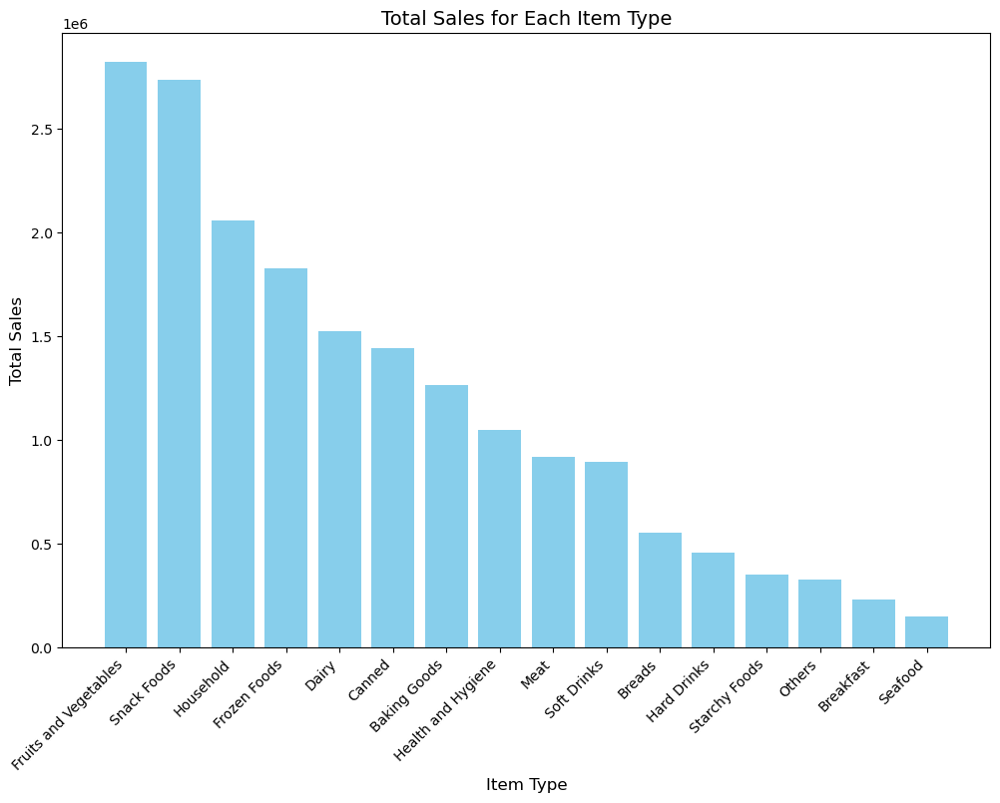

In [147]:
sorted_grouped_df = grouped_df.sort_values(('Item_Outlet_Sales', 'sum'), ascending=False)

# Extracting relevant data for plotting
item_types = sorted_grouped_df.index
total_sales = sorted_grouped_df[('Item_Outlet_Sales', 'sum')]

# Creating a bar plot
plt.figure(figsize=(12, 8))
plt.bar(item_types, total_sales, color='skyblue')
plt.xlabel('Item Type', fontsize=12)
plt.ylabel('Total Sales', fontsize=12)
plt.title('Total Sales for Each Item Type', fontsize=14)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.show()

In [201]:
train_csv.isnull()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales
0,False,False,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,True,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...
8518,False,False,False,False,False,False,False,False,False,False,False,False
8519,False,False,False,False,False,False,False,False,True,False,False,False
8520,False,False,False,False,False,False,False,False,False,False,False,False
8521,False,False,False,False,False,False,False,False,False,False,False,False


# Summary Statistics of the Filled Dataset with descrive()


In [158]:
train_csv.isnull().sum()

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64

In [159]:

# Create an imputer for 'Item_Weight' using mean strategy
imputer_weight = SimpleImputer(strategy='mean')
train_csv['Item_Weight'] = imputer_weight.fit_transform(train_csv[['Item_Weight']])

# Create an imputer for 'Outlet_Size' using the most frequent strategy (mode)
imputer_size = SimpleImputer(strategy='most_frequent')
train_csv['Outlet_Size'] = imputer_size.fit_transform(train_csv[['Outlet_Size']])



In [160]:
train_csv.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

In [161]:
train_csv.describe()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
count,8523.000000,8523.000000,8523.000000,8523.000000,8523.000000
mean,12.857645,0.066132,140.992782,1997.831867,2181.288914
std,4.226124,0.051598,62.275067,8.371760,1706.499616
min,4.555000,0.000000,31.290000,1985.000000,33.290000
25%,9.310000,0.026989,93.826500,1987.000000,834.247400
50%,12.857645,0.053931,143.012800,1999.000000,1794.331000
75%,16.000000,0.094585,185.643700,2004.000000,3101.296400
max,21.350000,0.328391,266.888400,2009.000000,13086.964800


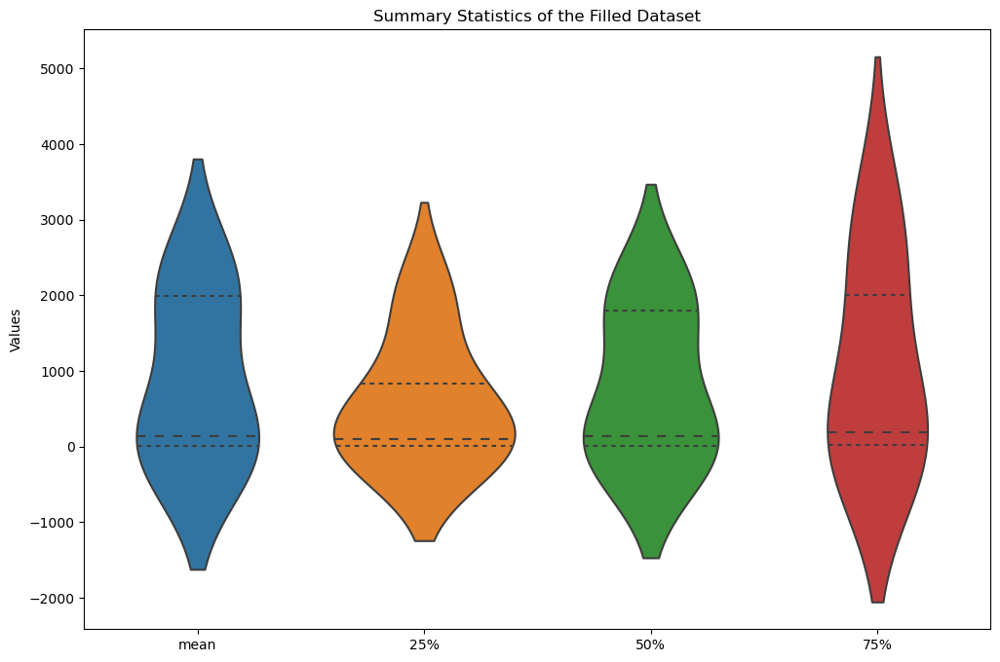

In [162]:
plt.figure(figsize=(12, 8))
sns.violinplot(data=train_csv.describe().T[['mean', '25%', '50%', '75%']], inner="quartile")
plt.title('Summary Statistics of the Filled Dataset')
plt.ylabel('Values')
plt.show()

# Outlier Detection: 
Identify and handle outliers

Outlet_Type

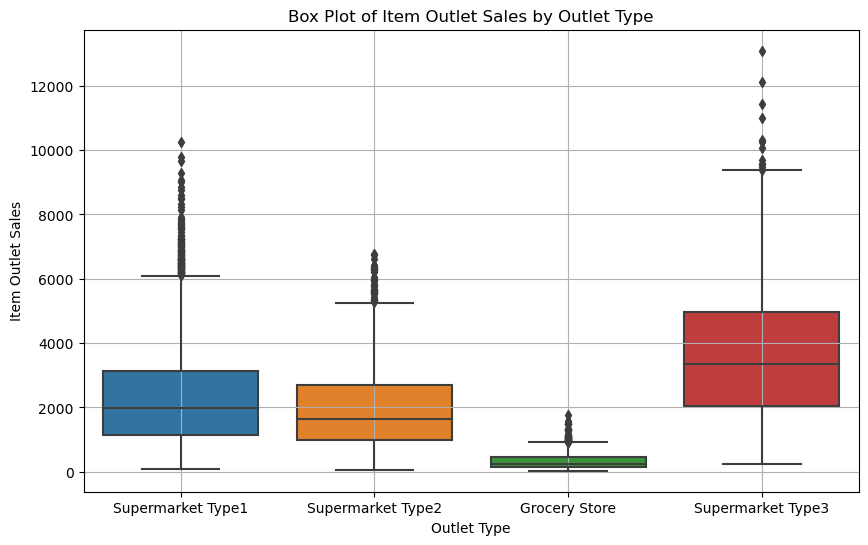

In [103]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Type', y='Item_Outlet_Sales', data=train_csv)
plt.title('Box Plot of Item Outlet Sales by Outlet Type')
plt.xlabel('Outlet Type')
plt.ylabel('Item Outlet Sales')
plt.grid(True)
plt.show()

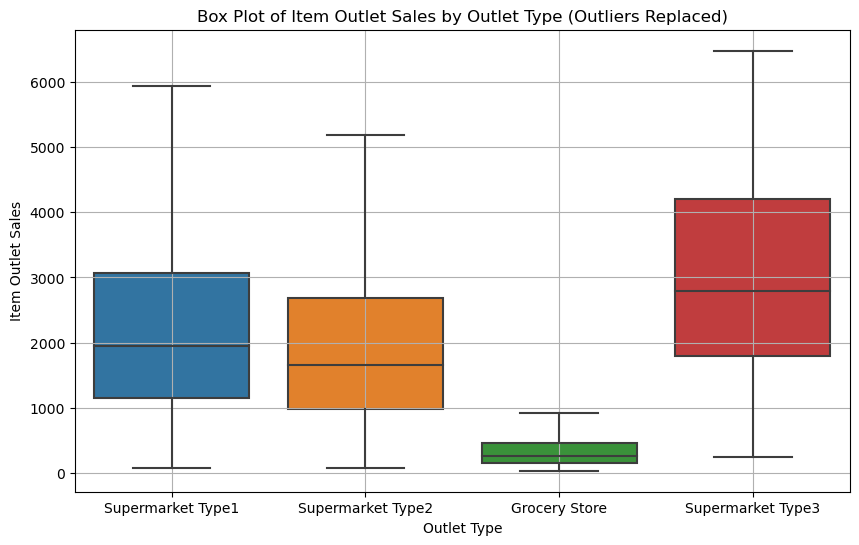

In [112]:
# Calculate IQR for Item_Outlet_Sales
Q1 = train_csv['Item_Outlet_Sales'].quantile(0.25)
Q3 = train_csv['Item_Outlet_Sales'].quantile(0.75)
IQR = Q3 - Q1

# Define lower and upper bounds
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Replace outliers with the median value
train_csv['Item_Outlet_Sales'] = np.where(
    (train_csv['Item_Outlet_Sales'] < lower_bound) | (train_csv['Item_Outlet_Sales'] > upper_bound),
    train_csv['Item_Outlet_Sales'].median(),
    train_csv['Item_Outlet_Sales']
)

# Verify that outliers have been replaced
plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Type', y='Item_Outlet_Sales', data=train_csv, showfliers=False)
plt.title('Box Plot of Item Outlet Sales by Outlet Type (Outliers Replaced)')
plt.xlabel('Outlet Type')
plt.ylabel('Item Outlet Sales')
plt.grid(True)
plt.show()

Item Fat Content

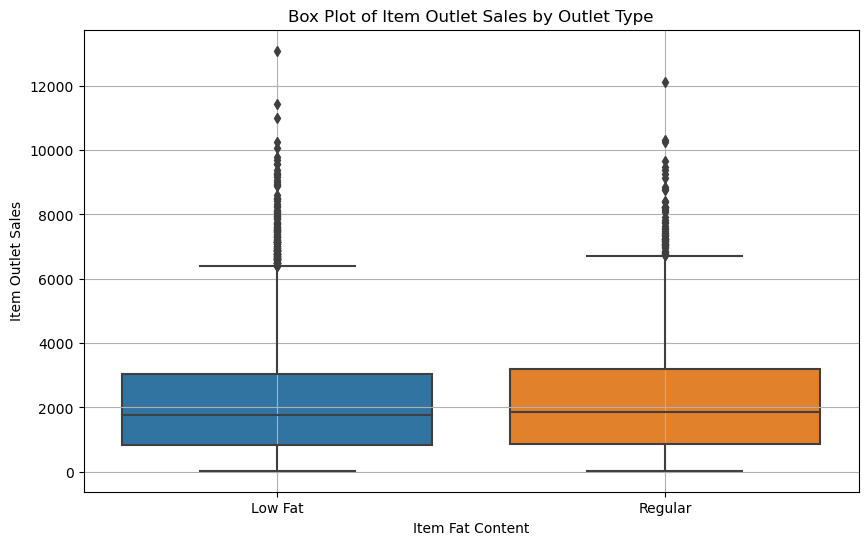

In [166]:
# Replace variations of 'Item_Fat_Content' with 'Low Fat'
train_csv['Item_Fat_Content'] = train_csv['Item_Fat_Content'].replace(['LF', 'low fat'], 'Low Fat')
train_csv['Item_Fat_Content'] = train_csv['Item_Fat_Content'].replace('reg', 'Regular')


plt.figure(figsize=(10, 6))
sns.boxplot(x='Item_Fat_Content', y='Item_Outlet_Sales', data=train_csv)
plt.title('Box Plot of Item Outlet Sales by Outlet Type')
plt.xlabel('Item Fat Content')
plt.ylabel('Item Outlet Sales')
plt.grid(True)
plt.show()

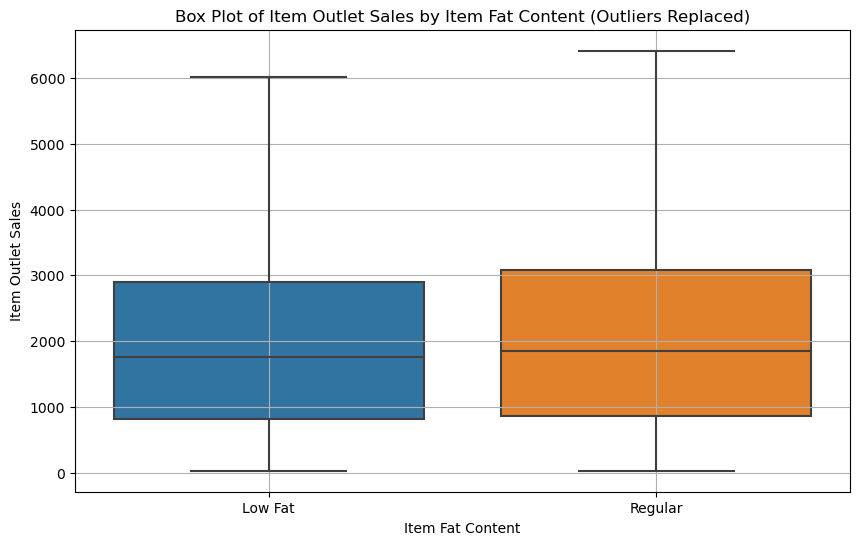

In [167]:
import numpy as np

# Calculate IQR for Item_Outlet_Sales within each Item_Fat_Content category
def replace_outliers(group):
    Q1 = group['Item_Outlet_Sales'].quantile(0.25)
    Q3 = group['Item_Outlet_Sales'].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the median value
    group['Item_Outlet_Sales'] = np.where(
        (group['Item_Outlet_Sales'] < lower_bound) | (group['Item_Outlet_Sales'] > upper_bound),
        group['Item_Outlet_Sales'].median(),
        group['Item_Outlet_Sales']
    )

    return group

# Apply the function to each group (Item_Fat_Content)
train_csv = train_csv.groupby('Item_Fat_Content', group_keys=False).apply(replace_outliers)

# Verify that outliers have been replaced
plt.figure(figsize=(10, 6))
sns.boxplot(x='Item_Fat_Content', y='Item_Outlet_Sales', data=train_csv, showfliers=False)
plt.title('Box Plot of Item Outlet Sales by Item Fat Content (Outliers Replaced)')
plt.xlabel('Item Fat Content')
plt.ylabel('Item Outlet Sales')
plt.grid(True)
plt.show()


Item Type

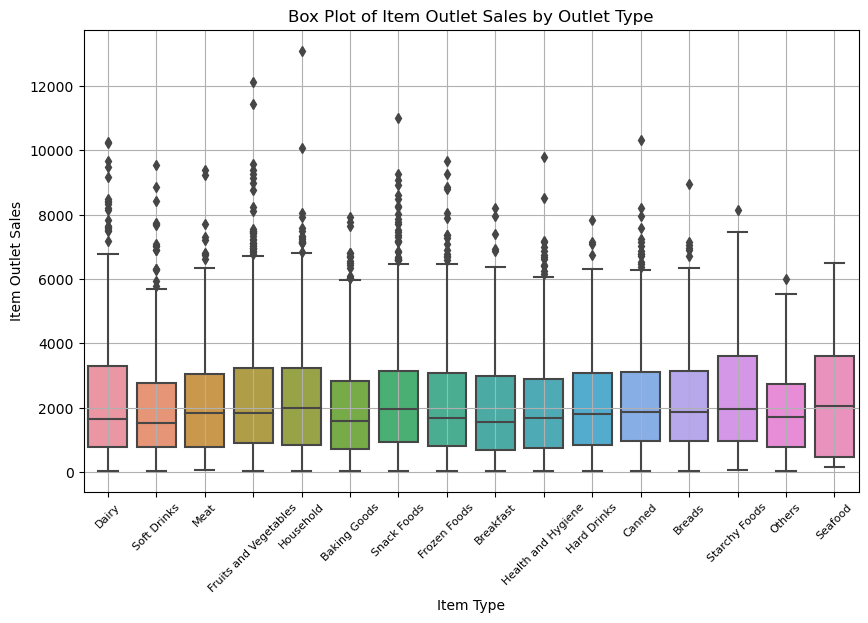

In [106]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='Item_Type', y='Item_Outlet_Sales', data=train_csv)
plt.title('Box Plot of Item Outlet Sales by Outlet Type')
plt.xlabel('Item Type')
plt.ylabel('Item Outlet Sales')
plt.xticks(fontsize=8, rotation=45) 
plt.grid(True)
plt.show()


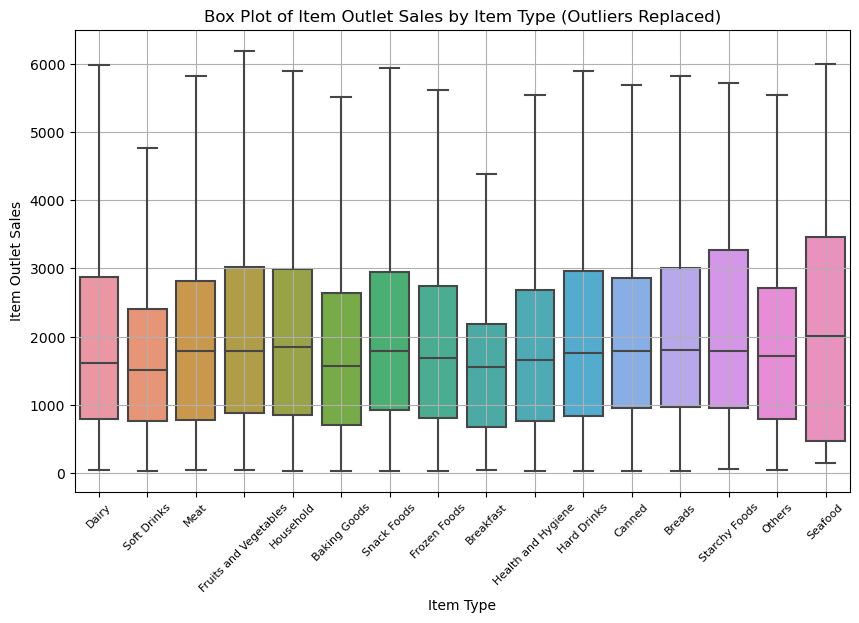

In [115]:
import numpy as np

# Calculate IQR for Item_Outlet_Sales within each Item_Type category
def replace_outliers(group):
    Q1 = group['Item_Outlet_Sales'].quantile(0.25)
    Q3 = group['Item_Outlet_Sales'].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the median value
    group['Item_Outlet_Sales'] = np.where(
        (group['Item_Outlet_Sales'] < lower_bound) | (group['Item_Outlet_Sales'] > upper_bound),
        group['Item_Outlet_Sales'].median(),
        group['Item_Outlet_Sales']
    )

    return group

# Apply the function to each group (Item_Type)
train_csv = train_csv.groupby('Item_Type', group_keys=False).apply(replace_outliers)

# Verify that outliers have been replaced
plt.figure(figsize=(10, 6))
sns.boxplot(x='Item_Type', y='Item_Outlet_Sales', data=train_csv, showfliers=False)
plt.title('Box Plot of Item Outlet Sales by Item Type (Outliers Replaced)')
plt.xlabel('Item Type')
plt.ylabel('Item Outlet Sales')
plt.xticks(fontsize=8, rotation=45)
plt.grid(True)
plt.show()


Outlet Identifier

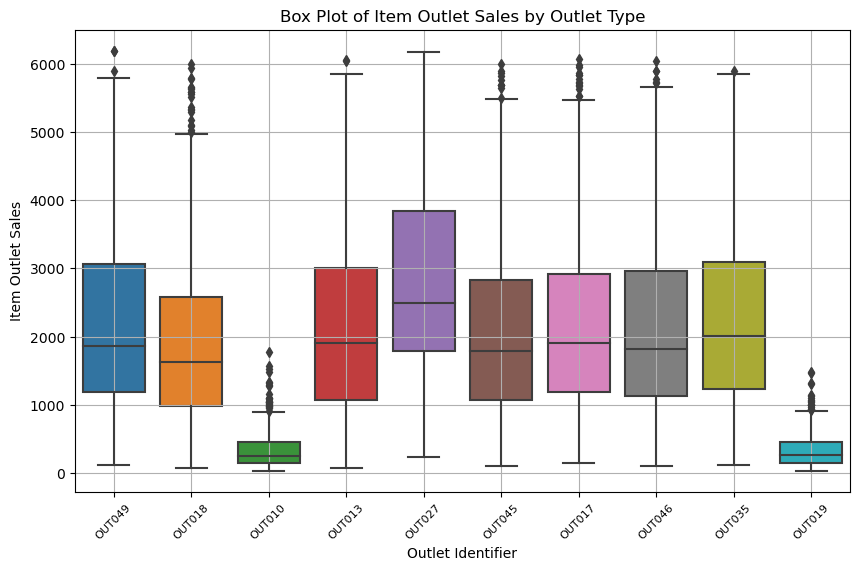

In [118]:

plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Identifier', y='Item_Outlet_Sales', data=train_csv)
plt.title('Box Plot of Item Outlet Sales by Outlet Type')
plt.xlabel('Outlet Identifier')
plt.ylabel('Item Outlet Sales')
plt.xticks(fontsize=8, rotation=45) 
plt.grid(True)
plt.show()



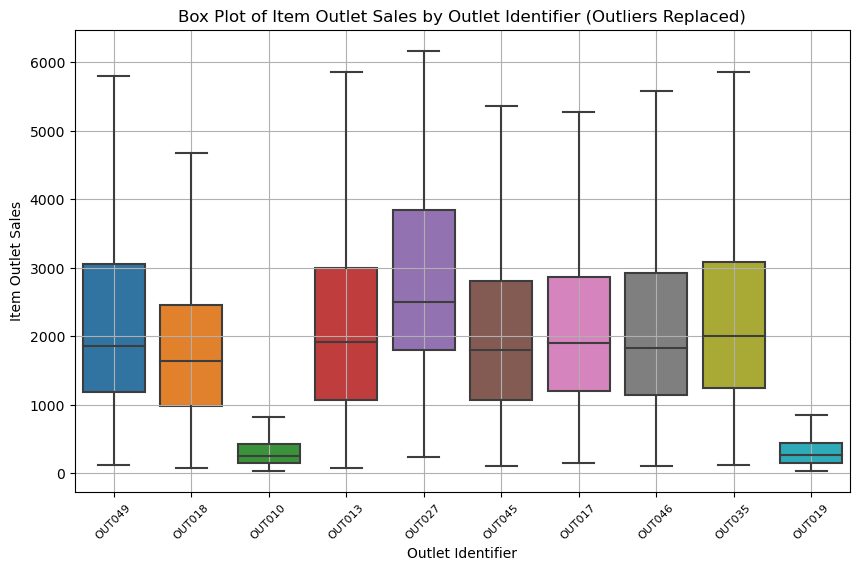

In [120]:
# Calculate IQR for Item_Outlet_Sales within each Outlet_Identifier category
def replace_outliers(group):
    Q1 = group['Item_Outlet_Sales'].quantile(0.25)
    Q3 = group['Item_Outlet_Sales'].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the median value
    group['Item_Outlet_Sales'] = np.where(
        (group['Item_Outlet_Sales'] < lower_bound) | (group['Item_Outlet_Sales'] > upper_bound),
        group['Item_Outlet_Sales'].median(),
        group['Item_Outlet_Sales']
    )

    return group

# Apply the function to each group (Outlet_Identifier)
train_csv = train_csv.groupby('Outlet_Identifier', group_keys=False).apply(replace_outliers)

# Verify that outliers have been replaced
plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Identifier', y='Item_Outlet_Sales', data=train_csv, showfliers=False)
plt.title('Box Plot of Item Outlet Sales by Outlet Identifier (Outliers Replaced)')
plt.xlabel('Outlet Identifier')
plt.ylabel('Item Outlet Sales')
plt.xticks(fontsize=8, rotation=45)
plt.grid(True)
plt.show()

Outlet Establishment Year

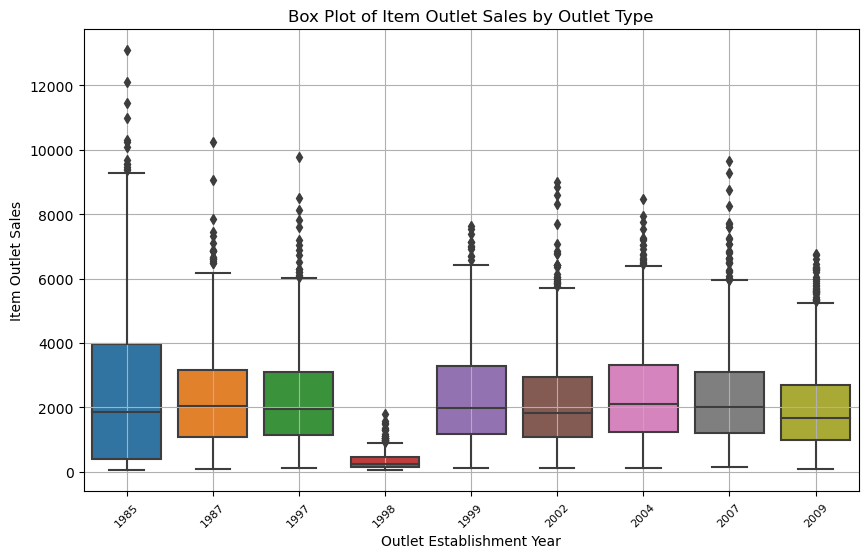

In [108]:

plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Establishment_Year', y='Item_Outlet_Sales', data=train_csv)
plt.title('Box Plot of Item Outlet Sales by Outlet Type')
plt.xlabel('Outlet Establishment Year')
plt.ylabel('Item Outlet Sales')
plt.xticks(fontsize=8, rotation=45) 
plt.grid(True)
plt.show()

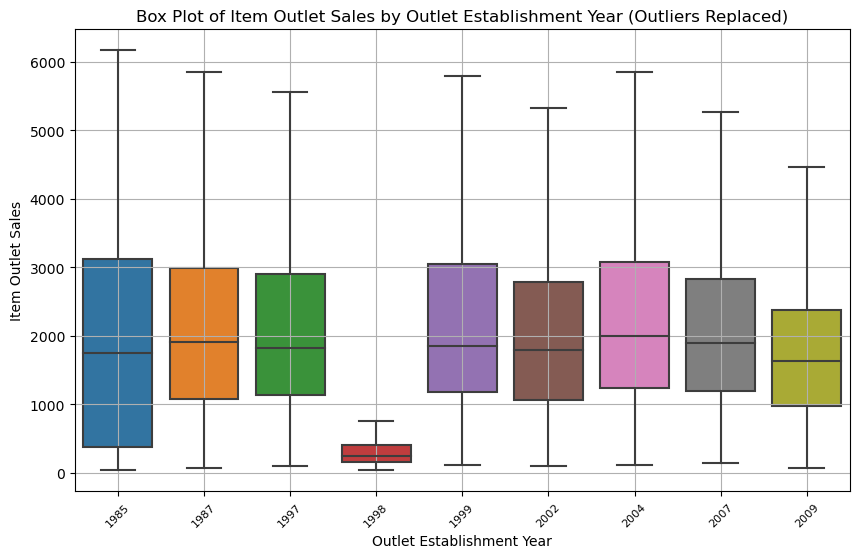

In [121]:
# Calculate IQR for Item_Outlet_Sales within each Outlet_Establishment_Year category
def replace_outliers(group):
    Q1 = group['Item_Outlet_Sales'].quantile(0.25)
    Q3 = group['Item_Outlet_Sales'].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the median value
    group['Item_Outlet_Sales'] = np.where(
        (group['Item_Outlet_Sales'] < lower_bound) | (group['Item_Outlet_Sales'] > upper_bound),
        group['Item_Outlet_Sales'].median(),
        group['Item_Outlet_Sales']
    )

    return group

# Apply the function to each group (Outlet_Establishment_Year)
train_csv = train_csv.groupby('Outlet_Establishment_Year', group_keys=False).apply(replace_outliers)

# Verify that outliers have been replaced
plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Establishment_Year', y='Item_Outlet_Sales', data=train_csv, showfliers=False)
plt.title('Box Plot of Item Outlet Sales by Outlet Establishment Year (Outliers Replaced)')
plt.xlabel('Outlet Establishment Year')
plt.ylabel('Item Outlet Sales')
plt.xticks(fontsize=8, rotation=45)
plt.grid(True)
plt.show()

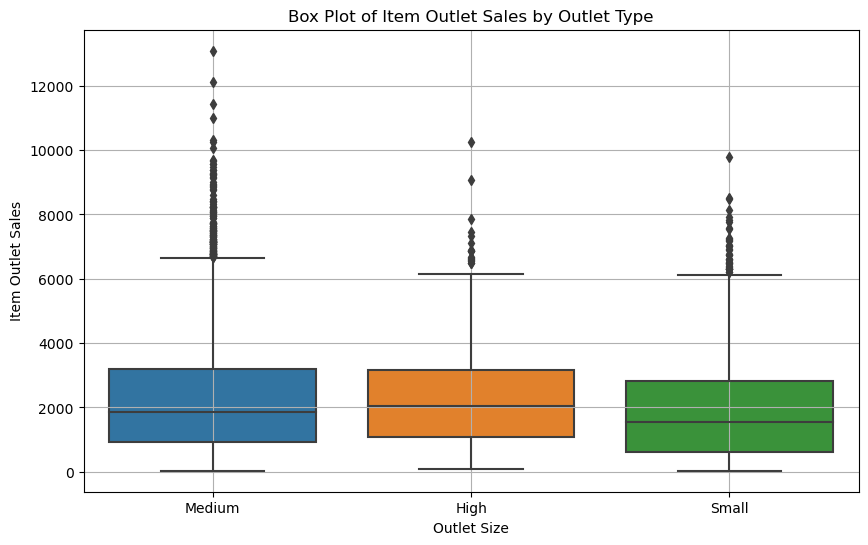

In [110]:


plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Size', y='Item_Outlet_Sales', data=train_csv)
plt.title('Box Plot of Item Outlet Sales by Outlet Type')
plt.xlabel('Outlet Size')
plt.ylabel('Item Outlet Sales')

plt.grid(True)
plt.show()

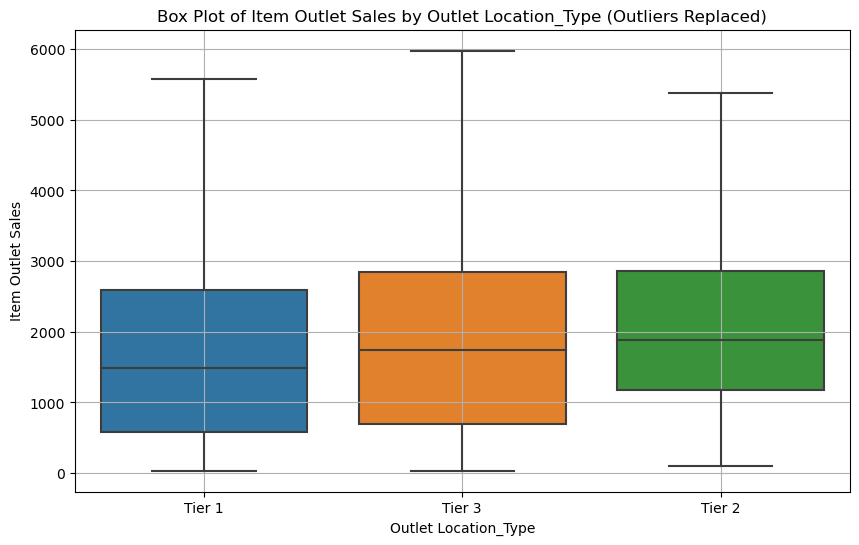

In [122]:
def replace_outliers(group):
    Q1 = group['Item_Outlet_Sales'].quantile(0.25)
    Q3 = group['Item_Outlet_Sales'].quantile(0.75)
    IQR = Q3 - Q1

    # Define lower and upper bounds
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Replace outliers with the median value
    group['Item_Outlet_Sales'] = np.where(
        (group['Item_Outlet_Sales'] < lower_bound) | (group['Item_Outlet_Sales'] > upper_bound),
        group['Item_Outlet_Sales'].median(),
        group['Item_Outlet_Sales']
    )

    return group

# Apply the function to each group (Outlet_Location_Type)
train_csv = train_csv.groupby('Outlet_Location_Type', group_keys=False).apply(replace_outliers)

# Verify that outliers have been replaced
plt.figure(figsize=(10, 6))
sns.boxplot(x='Outlet_Location_Type', y='Item_Outlet_Sales', data=train_csv, showfliers=False)
plt.title('Box Plot of Item Outlet Sales by Outlet Location_Type (Outliers Replaced)')
plt.xlabel('Outlet Location_Type')
plt.ylabel('Item Outlet Sales')
plt.grid(True)
plt.show()

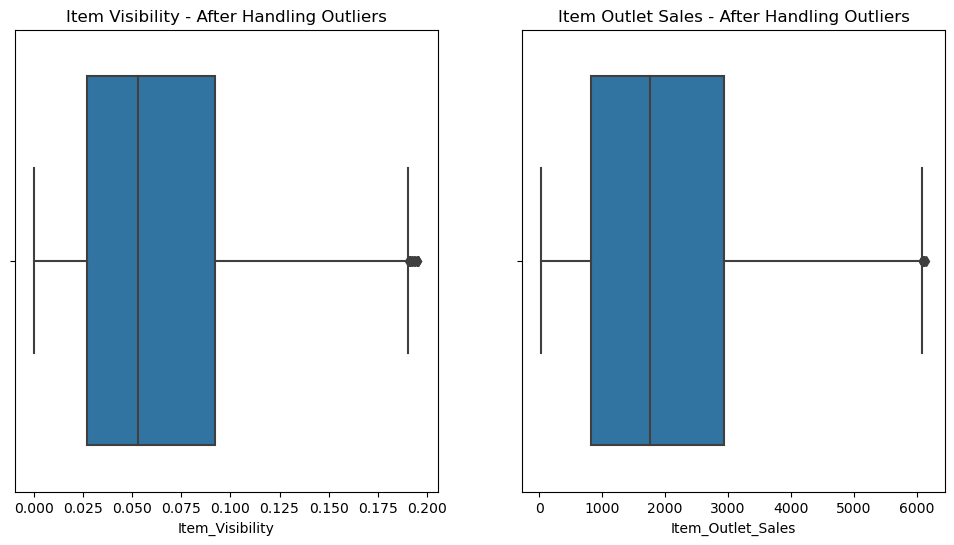

In [169]:
# Identify outliers for 'Item_Visibility'
Q1_visibility = train_csv['Item_Visibility'].quantile(0.25)
Q3_visibility = train_csv['Item_Visibility'].quantile(0.75)
IQR_visibility = Q3_visibility - Q1_visibility

outliers_visibility = (
    (train_csv['Item_Visibility'] < Q1_visibility - 1.5 * IQR_visibility) |
    (train_csv['Item_Visibility'] > Q3_visibility + 1.5 * IQR_visibility)
)

# Identify outliers for 'Item_Outlet_Sales'
Q1_sales = train_csv['Item_Outlet_Sales'].quantile(0.25)
Q3_sales = train_csv['Item_Outlet_Sales'].quantile(0.75)
IQR_sales = Q3_sales - Q1_sales

outliers_sales = (
    (train_csv['Item_Outlet_Sales'] < Q1_sales - 1.5 * IQR_sales) |
    (train_csv['Item_Outlet_Sales'] > Q3_sales + 1.5 * IQR_sales)
)

# Handle outliers by replacing them with NaN or removing them
train_csv.loc[outliers_visibility, 'Item_Visibility'] = None  # Replace with NaN
train_csv.loc[outliers_sales, 'Item_Outlet_Sales'] = None  # Replace with NaN

# Visualize the data distribution after handling outliers
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
sns.boxplot(x=train_csv['Item_Visibility'])
plt.title('Item Visibility - After Handling Outliers')

plt.subplot(1, 2, 2)
sns.boxplot(x=train_csv['Item_Outlet_Sales'])
plt.title('Item Outlet Sales - After Handling Outliers')

plt.show()

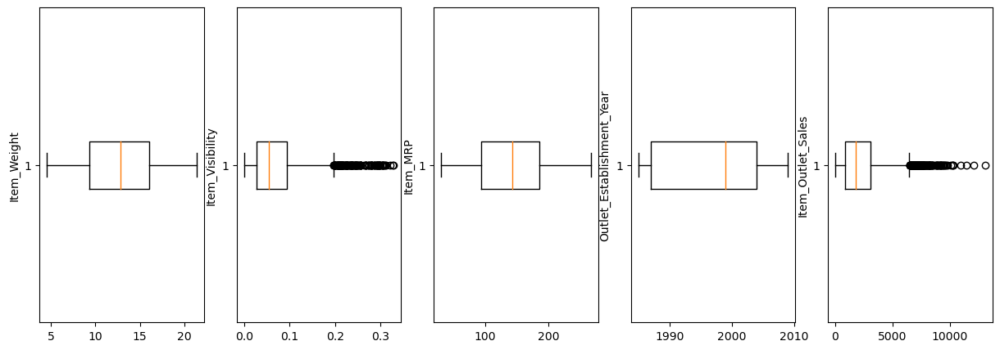

In [252]:
# Assuming 'train_csv' is your DataFrame
numeric_columns = train_csv.select_dtypes(include=['float64', 'int64']).columns

fig, axs = plt.subplots(1, len(numeric_columns), figsize=(15, 5))

# Iterate over numeric columns and create boxplots
for i, col in enumerate(numeric_columns):
    axs[i].boxplot(train_csv[col], vert=False)
    axs[i].set_ylabel(col)

plt.show()

In [254]:

# Identify the quartiles
q1, q3 = np.percentile(train_csv['Item_Weight'], [25, 75])
# Calculate the interquartile range
iqr = q3 - q1
# Calculate the lower and upper bounds
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)
# Drop the outliers
clean_data = train_csv[(train_csv['Item_Weight'] >= lower_bound) 
                & (train_csv['Item_Weight'] <= upper_bound)]
 
 
# Identify the quartiles
q1, q3 = np.percentile(clean_data['Item_Visibility'], [25, 75])
# Calculate the interquartile range
iqr = q3 - q1
# Calculate the lower and upper bounds
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)
# Drop the outliers
clean_data = clean_data[(clean_data['Item_Visibility'] >= lower_bound) 
                        & (clean_data['Item_Visibility'] <= upper_bound)]
 
 
# Identify the quartiles
q1, q3 = np.percentile(clean_data['Item_MRP'], [25, 75])
# Calculate the interquartile range
iqr = q3 - q1
# Calculate the lower and upper bounds
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)
# Drop the outliers
clean_data = clean_data[(clean_data['Item_MRP'] >= lower_bound) 
                        & (clean_data['Item_MRP'] <= upper_bound)]
 
 
# Identify the quartiles
q1, q3 = np.percentile(clean_data['Item_Outlet_Sales'], [25, 75])
# Calculate the interquartile range
iqr = q3 - q1
# Calculate the lower and upper bounds
lower_bound = q1 - (1.5 * iqr)
upper_bound = q3 + (1.5 * iqr)
# Drop the outliers
clean_data = clean_data[(clean_data['Item_Outlet_Sales'] >= lower_bound) 
                        & (clean_data['Item_Outlet_Sales'] <= upper_bound)]
 



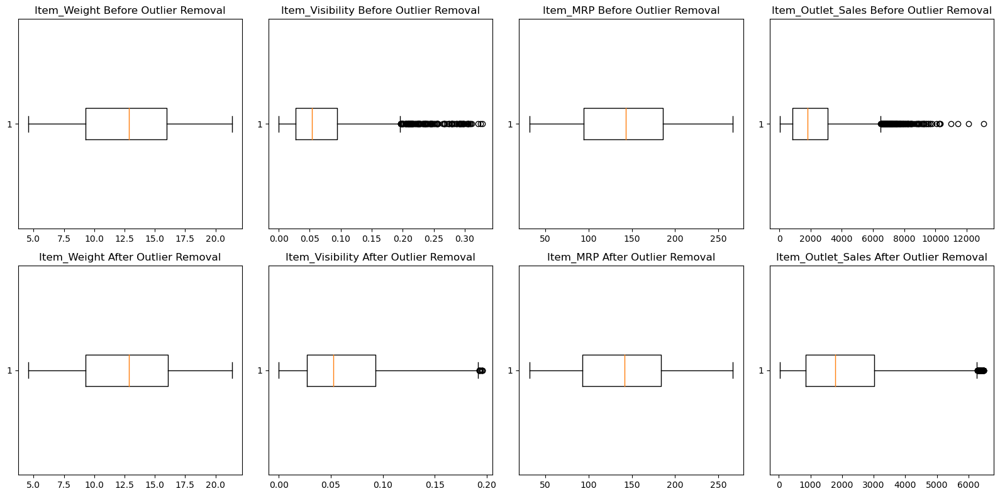

In [255]:
# Set up subplots
fig, axs = plt.subplots(2, 4, figsize=(16, 8))

# Plot boxplots before and after removing outliers for each column
columns_to_plot = ['Item_Weight', 'Item_Visibility', 'Item_MRP', 'Item_Outlet_Sales']

for i, col in enumerate(columns_to_plot):
    # Plot before removing outliers
    axs[0, i].boxplot(train_csv[col], vert=False)
    axs[0, i].set_title(f'{col} Before Outlier Removal')

    # Plot after removing outliers
    axs[1, i].boxplot(clean_data[col], vert=False)
    axs[1, i].set_title(f'{col} After Outlier Removal')

# Display plots
plt.tight_layout()
plt.show()

# Correlation Analysis of Key Variables: Exploring Relationships in the Dataset

In [204]:

# Load the data from the CSV file
Train = pd.read_csv('Train.csv')

# Calculate the correlation matrix
correlation_matrix = Train.corr(numeric_only=True)
correlation_matrix.head()



,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales
Item_Weight,1.000000,-0.014048,0.027141,-0.011588,0.014123
Item_Visibility,-0.014048,1.000000,-0.001315,-0.074834,-0.128625
Item_MRP,0.027141,-0.001315,1.000000,0.005020,0.567574
Outlet_Establishment_Year,-0.011588,-0.074834,0.005020,1.000000,-0.049135
Item_Outlet_Sales,0.014123,-0.128625,0.567574,-0.049135,1.000000


# Item_Weight and Item_Outlet_Sales:

-The correlation coefficient is 0.014123, which is close to zero.
-There is a very weak positive correlation between Item_Weight and Item_Outlet_Sales.

# Item_Visibility and Item_Outlet_Sales:

-The correlation coefficient is -0.128625.
-There is a weak negative correlation between Item_Visibility and Item_Outlet_Sales.
-This suggests that as the visibility of the item in the store decreases, the sales tend to increase slightly, although the correlation is not very strong.

# Item_MRP and Item_Outlet_Sales:

-The correlation coefficient is 0.567574.
-There is a moderate positive correlation between Item_MRP (Maximum Retail Price) and Item_Outlet_Sales.
-This indicates that higher MRP values are associated with higher sales.

# Outlet_Establishment_Year and Item_Outlet_Sales:

-The correlation coefficient is -0.049135.
-There is a very weak negative correlation between the year of outlet establishment and item sales.
-This suggests that there is a slight tendency for older outlets to have slightly lower sales, but the correlation is not strong.


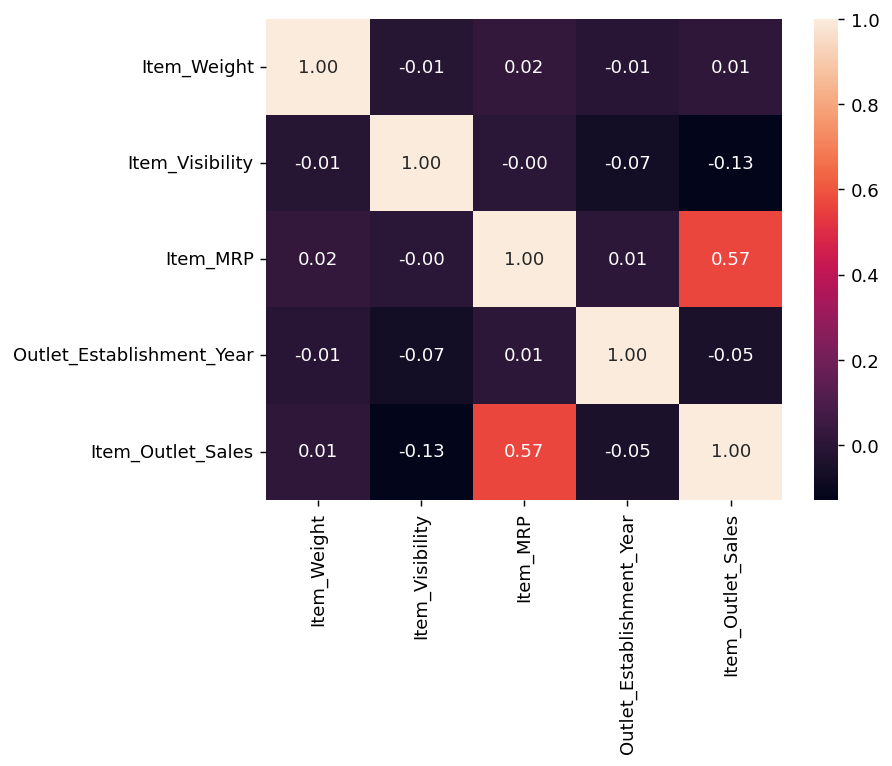

In [258]:
corr = train_csv.corr(numeric_only=True) 
plt.figure(dpi=130)
sns.heatmap(train_csv.corr(numeric_only=True), annot=True, fmt='.2f')
plt.show()

In [261]:
corr['Item_Outlet_Sales'].sort_values(ascending = False)

Item_Outlet_Sales            1.000000
Item_MRP                     0.567574
Item_Weight                  0.011550
Outlet_Establishment_Year   -0.049135
Item_Visibility             -0.128625
Name: Item_Outlet_Sales, dtype: float64

The correlation coefficients indicate a strong positive correlation (0.567574) between 'Item_Outlet_Sales' and 'Item_MRP,' minimal positive correlation with 'Item_Weight,' a very weak negative correlation with 'Outlet_Establishment_Year,' and a moderate negative correlation with 'Item_Visibility.'

In [259]:
corr['Item_Weight'].sort_values(ascending = False)

Item_Weight                  1.000000
Item_MRP                     0.024756
Item_Outlet_Sales            0.011550
Outlet_Establishment_Year   -0.008301
Item_Visibility             -0.012049
Name: Item_Weight, dtype: float64

There is a very weak positive correlation (0.024756) between 'Item_Weight' and 'Item_MRP,' indicating minimal linear association between the weight of the item and its maximum retail price.

The correlation coefficient of 0.011550 suggests a very weak positive correlation between 'Item_Weight' and 'Item_Outlet_Sales,' indicating that the weight of the item has minimal impact on its sales.

With a correlation coefficient of -0.008301, there is a very weak negative correlation between 'Item_Weight' and 'Outlet_Establishment_Year,' implying minimal linear relationship between the weight of the item and the year of outlet establishment.

'Item_Weight' shows a very weak negative correlation (-0.012049) with 'Item_Visibility,' suggesting minimal linear association between the weight of the item and its visibility in the store.

In [260]:
corr['Item_Visibility'].sort_values(ascending = False)

Item_Visibility              1.000000
Item_MRP                    -0.001315
Item_Weight                 -0.012049
Outlet_Establishment_Year   -0.074834
Item_Outlet_Sales           -0.128625
Name: Item_Visibility, dtype: float64


The correlation coefficients reveal minimal linear associations between 'Item_Visibility' and both 'Item_MRP' and 'Item_Weight,' a moderately weak negative correlation with 'Outlet_Establishment_Year,' and a moderate negative correlation with 'Item_Outlet_Sales,' suggesting a slight increase in sales as visibility decreases.

# Applying Feature engineering 
 Feature engineering involves creating new features or transforming existing ones to enhance the performance of machine learning models



Calculate the age of each store based on the 'Outlet_Establishment_Year'.


In [173]:
train_csv['Store_Age'] = 2024 - train_csv['Outlet_Establishment_Year']
train_csv.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Category,Store_Age
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,FD,25
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,DR,15
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,FD,25
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Medium,Tier 3,Grocery Store,732.3800,FD,26
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,NC,37


In [185]:

train_csv.head()

,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Category,Store_Age
0,FDA15,9.30,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,FD,25
1,DRC01,5.92,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,DR,15
2,FDN15,17.50,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,FD,25
3,FDX07,19.20,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Medium,Tier 3,Grocery Store,732.3800,FD,26
4,NCD19,8.93,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,NC,37


In [188]:
item_sales_per_store = train_csv.groupby('Outlet_Identifier')['Item_Outlet_Sales'].mean().reset_index()
item_sales_per_store.rename(columns={'Item_Outlet_Sales': 'Avg_Item_Sales_Per_Store'}, inplace=True)

train_csv = pd.merge(train_csv, item_sales_per_store, on='Outlet_Identifier', how='left')


,Item_Identifier,Item_Weight,Item_Fat_Content,Item_Visibility,Item_Type,Item_MRP,Outlet_Identifier,Outlet_Establishment_Year,Outlet_Size,Outlet_Location_Type,Outlet_Type,Item_Outlet_Sales,Item_Category,Store_Age,Avg_Item_Sales_Per_Store_x,Avg_Item_Sales_Per_Store
0,FDA15,9.300000,Low Fat,0.016047,Dairy,249.8092,OUT049,1999,Medium,Tier 1,Supermarket Type1,3735.1380,FD,25,2237.925865,2237.925865
1,DRC01,5.920000,Regular,0.019278,Soft Drinks,48.2692,OUT018,2009,Medium,Tier 3,Supermarket Type2,443.4228,DR,15,1941.758711,1941.758711
2,FDN15,17.500000,Low Fat,0.016760,Meat,141.6180,OUT049,1999,Medium,Tier 1,Supermarket Type1,2097.2700,FD,25,2237.925865,2237.925865
3,FDX07,19.200000,Regular,0.000000,Fruits and Vegetables,182.0950,OUT010,1998,Medium,Tier 3,Grocery Store,732.3800,FD,26,339.351662,339.351662
4,NCD19,8.930000,Low Fat,0.000000,Household,53.8614,OUT013,1987,High,Tier 3,Supermarket Type1,994.7052,NC,37,2196.187476,2196.187476
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
95,FDU04,12.857645,Low Fat,0.009715,Frozen Foods,120.0414,OUT019,1985,Small,Tier 1,Grocery Store,487.3656,FD,39,340.329723,340.329723
96,FDF41,12.150000,Low Fat,0.131384,Frozen Foods,246.0460,OUT049,1999,Medium,Tier 1,Supermarket Type1,1231.7300,FD,25,2237.925865,2237.925865
97,FDB56,8.750000,Regular,0.074613,Fruits and Vegetables,187.4556,OUT035,2004,Small,Tier 2,Supermarket Type1,3755.1120,FD,20,2316.476535,2316.476535
98,NCP18,12.857645,Low Fat,0.028460,Household,149.9708,OUT027,1985,Medium,Tier 3,Supermarket Type3,4363.6532,NC,39,2940.855700,2940.855700


In [227]:

# Create an imputer for 'Item_Weight' using mean strategy
item_weight_imputer = SimpleImputer(strategy='mean')
train_csv['Item_Weight'] = item_weight_imputer.fit_transform(train_csv[['Item_Weight']])

# Create an imputer for 'Outlet_Size' using most frequent strategy
outlet_size_imputer = SimpleImputer(strategy='most_frequent')
train_csv['Outlet_Size'] = outlet_size_imputer.fit_transform(train_csv[['Outlet_Size']])

# Save the modified DataFrame to a new CSV file
train_csv.to_csv('train_data_imputed.csv', index=False)

# Numerical Feature Standardization using StandardScaler

In [129]:
from sklearn.preprocessing import StandardScaler
numerical_columns = train_csv.select_dtypes(include=['float64', 'int64']).columns

# Create a copy of the DataFrame to avoid modifying the original data
normalized_df = train_csv.copy()

# Initialize StandardScaler
scaler = StandardScaler()

# Apply StandardScaler to the selected numerical columns
normalized_df[numerical_columns] = scaler.fit_transform(normalized_df[numerical_columns])

# Display the normalized DataFrame
print("Normalized DataFrame:")
print(normalized_df.head())


Normalized DataFrame:
  Item_Identifier  Item_Weight Item_Fat_Content  Item_Visibility  \
0           FDA15    -0.766217          Low Fat        -0.970732   
1           DRC01    -1.494175          Regular        -0.908111   
2           FDN15     0.999834          Low Fat        -0.956917   
3           FDX07     1.365966          Regular        -1.281758   
4           NCD19    -0.845905          Low Fat        -1.281758   

               Item_Type  Item_MRP Outlet_Identifier  \
0                  Dairy  1.747454            OUT049   
1            Soft Drinks -1.489023            OUT018   
2                   Meat  0.010040            OUT049   
3  Fruits and Vegetables  0.660050            OUT010   
4              Household -1.399220            OUT013   

   Outlet_Establishment_Year Outlet_Size Outlet_Location_Type  \
0                   0.139541      Medium               Tier 1   
1                   1.334103      Medium               Tier 3   
2                   0.139541      Med

#  One-Hot encoding

In [205]:
categorical_columns = train_csv.select_dtypes(include=['object']).columns

# Appliquez l'encodage one-hot à toutes les colonnes catégorielles
train_csv_encoded = pd.get_dummies(train_csv, columns=categorical_columns)

# Affichez les premières lignes du DataFrame encodé
print(train_csv_encoded.head())

   Item_Weight  Item_Visibility  Item_MRP  Outlet_Establishment_Year  \
0         9.30         0.016047  249.8092                       1999   
1         5.92         0.019278   48.2692                       2009   
2        17.50         0.016760  141.6180                       1999   
3        19.20         0.000000  182.0950                       1998   
4         8.93         0.000000   53.8614                       1987   

   Item_Outlet_Sales  Item_Identifier_DRA12  Item_Identifier_DRA24  \
0          3735.1380                      0                      0   
1           443.4228                      0                      0   
2          2097.2700                      0                      0   
3           732.3800                      0                      0   
4           994.7052                      0                      0   

   Item_Identifier_DRA59  Item_Identifier_DRB01  Item_Identifier_DRB13  ...  \
0                      0                      0                    

In [206]:
train_csv_encoded.head()

,Item_Weight,Item_Visibility,Item_MRP,Outlet_Establishment_Year,Item_Outlet_Sales,Item_Identifier_DRA12,Item_Identifier_DRA24,Item_Identifier_DRA59,Item_Identifier_DRB01,Item_Identifier_DRB13,...,Outlet_Size_High,Outlet_Size_Medium,Outlet_Size_Small,Outlet_Location_Type_Tier 1,Outlet_Location_Type_Tier 2,Outlet_Location_Type_Tier 3,Outlet_Type_Grocery Store,Outlet_Type_Supermarket Type1,Outlet_Type_Supermarket Type2,Outlet_Type_Supermarket Type3
0,9.30,0.016047,249.8092,1999,3735.1380,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
1,5.92,0.019278,48.2692,2009,443.4228,0,0,0,0,0,...,0,1,0,0,0,1,0,0,1,0
2,17.50,0.016760,141.6180,1999,2097.2700,0,0,0,0,0,...,0,1,0,1,0,0,0,1,0,0
3,19.20,0.000000,182.0950,1998,732.3800,0,0,0,0,0,...,0,0,0,0,0,1,1,0,0,0
4,8.93,0.000000,53.8614,1987,994.7052,0,0,0,0,0,...,1,0,0,0,0,1,0,1,0,0


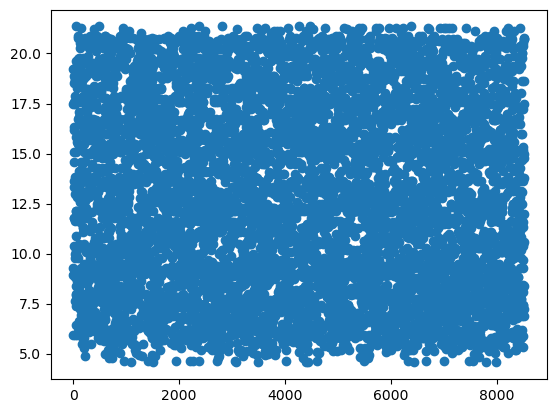

In [139]:
plt.scatter(range(len(train_csv_encoded)), train_csv_encoded['Item_Weight'])
plt.show()


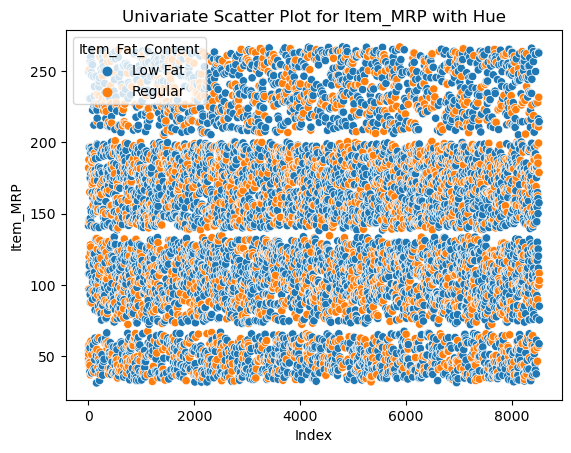

In [207]:
sns.scatterplot(x=train_csv.index, y=train_csv['Item_MRP'], hue=train_csv['Item_Fat_Content'])
plt.title('Univariate Scatter Plot for Item_MRP with Hue')
plt.xlabel('Index')
plt.ylabel('Item_MRP')
plt.legend(title='Item_Fat_Content')
plt.show()

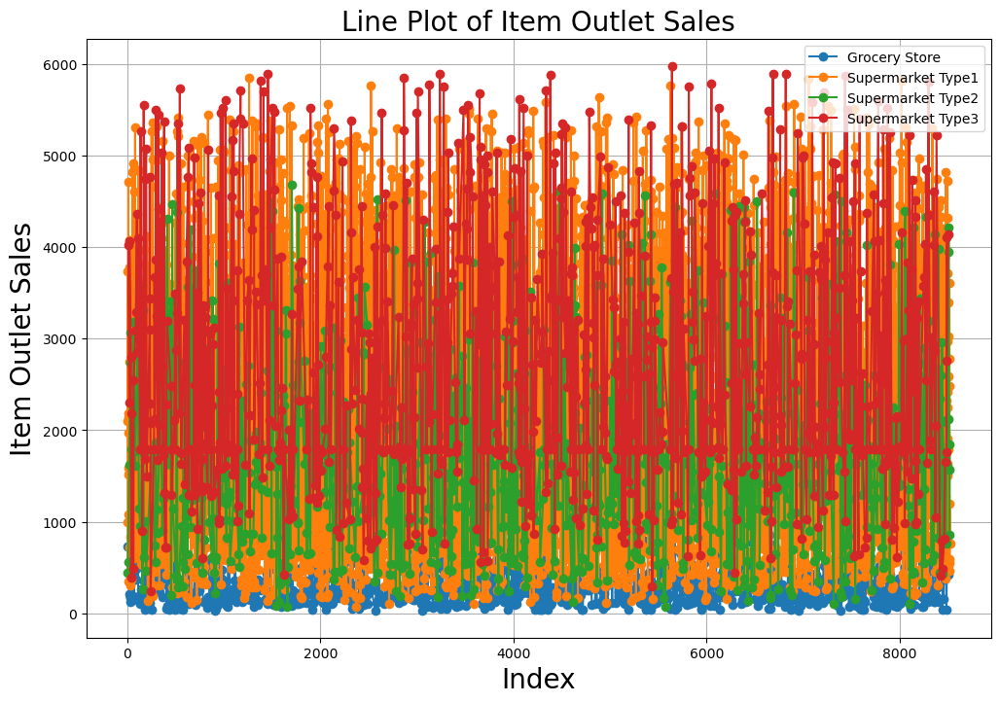

In [146]:
import matplotlib.pyplot as plt

# Increase the figure size
plt.figure(figsize=(12, 8))

# Title and axis labels
plt.title('Line Plot of Item Outlet Sales', fontsize=20)
plt.xlabel('Index', fontsize=20)
plt.ylabel('Item Outlet Sales', fontsize=20)

# Plotting lines for each Outlet_Type
for name, group in train_csv.groupby('Outlet_Type'):
    plt.plot(group.index, group['Item_Outlet_Sales'], label=name, marker='o', markevery=1, markersize=6)

# Add legend and grid
plt.legend()
plt.grid(True)

# Show the plot
plt.show()



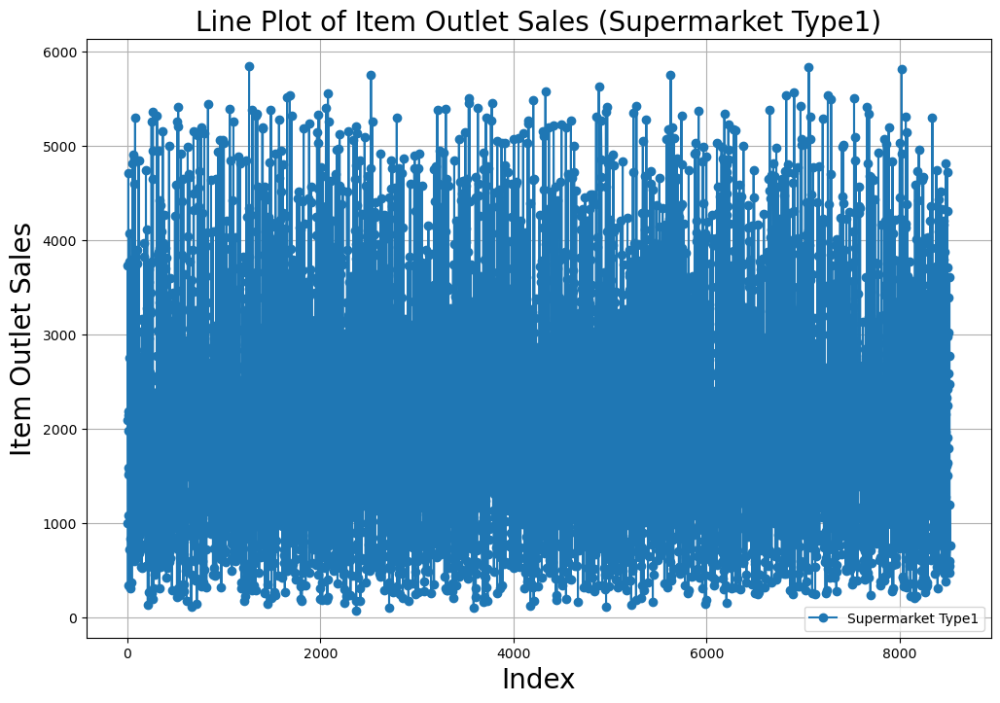

In [147]:
import matplotlib.pyplot as plt

# Filtrer les données pour inclure uniquement 'Supermarket Type1'
subset_data = train_csv[train_csv['Outlet_Type'] == 'Supermarket Type1']

# Augmenter la taille de la figure
plt.figure(figsize=(12, 8))

# Titre et étiquettes des axes
plt.title('Line Plot of Item Outlet Sales (Supermarket Type1)', fontsize=20)
plt.xlabel('Index', fontsize=20)
plt.ylabel('Item Outlet Sales', fontsize=20)

# Tracer la ligne pour 'Supermarket Type1'
plt.plot(subset_data.index, subset_data['Item_Outlet_Sales'], label='Supermarket Type1', marker='o', markevery=1, markersize=6)

# Ajouter une légende et une grille
plt.legend()
plt.grid(True)

# Afficher le graphique
plt.show()


# Distribution of Item Outlet Sales  using stripplot

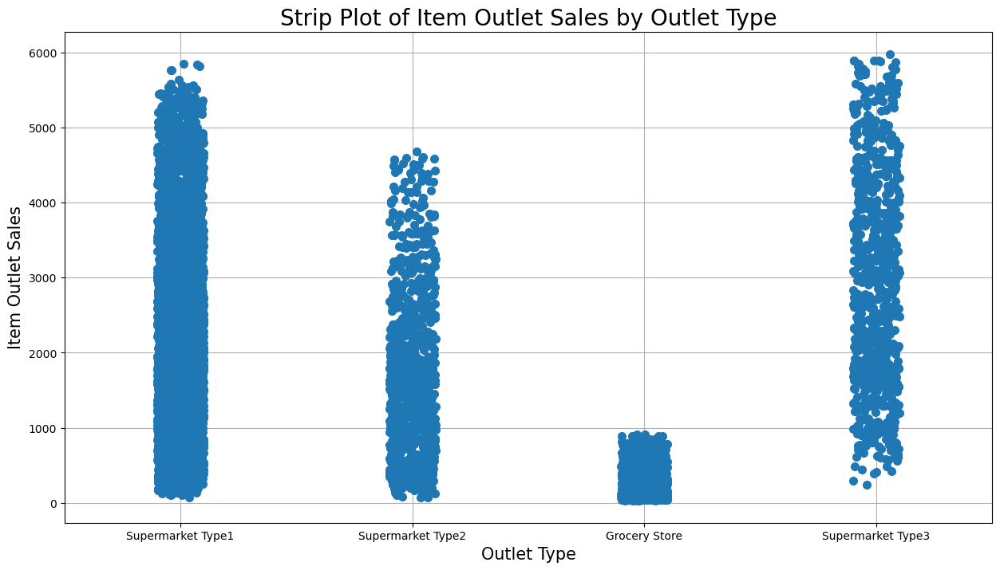

In [150]:



# Augmenter la taille de la figure
plt.figure(figsize=(15, 8))

# Titre et étiquettes des axes
plt.title('Strip Plot of Item Outlet Sales by Outlet Type', fontsize=20)
plt.xlabel('Outlet Type', fontsize=15)
plt.ylabel('Item Outlet Sales', fontsize=15)

# Créer un strip plot avec Seaborn
sns.stripplot(x='Outlet_Type', y='Item_Outlet_Sales', data=train_csv, jitter=True, size=8)

# Ajouter une grille
plt.grid(True)

# Afficher le graphique
plt.show()





In the observed data, Supermarket Type 1 exhibits the highest number of outlet sales, followed by Supermarket Type 3 and then Type 2. In contrast, the Grocery Store category has significantly lower outlet sales.

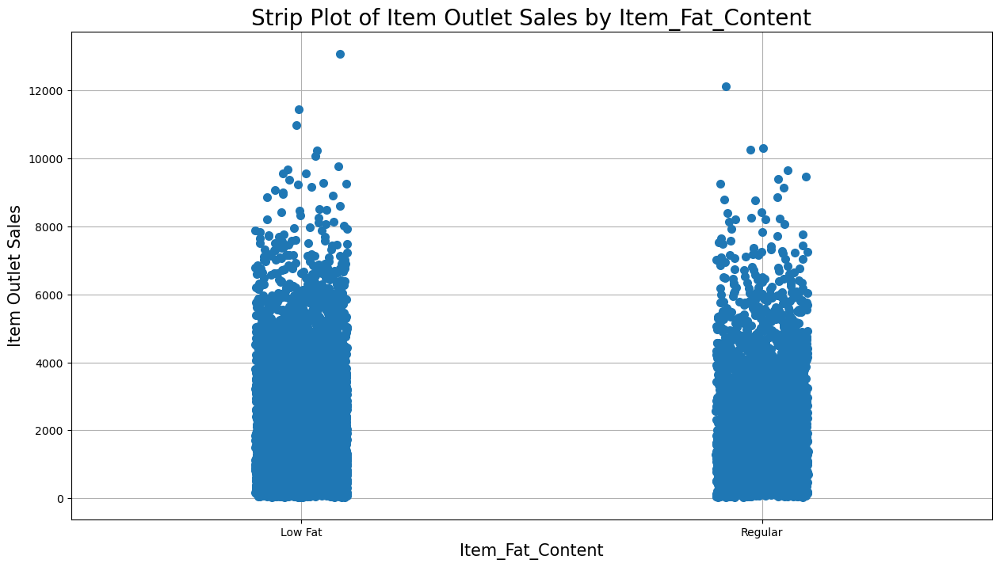

In [208]:
plt.figure(figsize=(15, 8))

# Titre et étiquettes des axes
plt.title('Strip Plot of Item Outlet Sales by Item_Fat_Content', fontsize=20)
plt.xlabel('Item_Fat_Content', fontsize=15)
plt.ylabel('Item Outlet Sales', fontsize=15)

# Créer un strip plot avec Seaborn
sns.stripplot(x='Item_Fat_Content', y='Item_Outlet_Sales', data=train_csv, jitter=True, size=8)

# Ajouter une grille
plt.grid(True)

# Afficher le graphique
plt.show()


In the observed data, the "Low Fat" category appears slightly more prevalent than the "Regular" category.

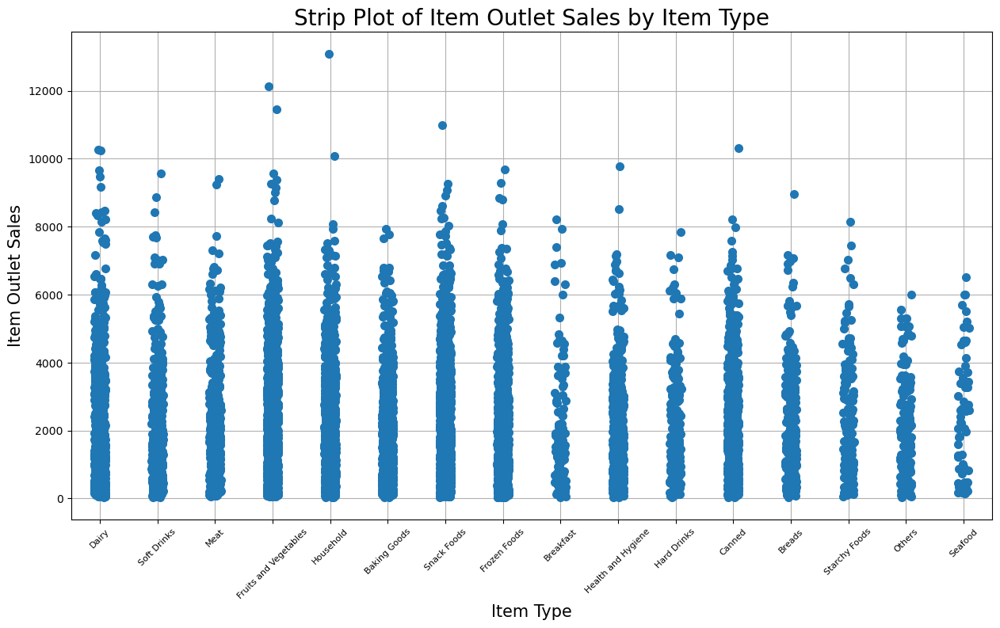

In [211]:
plt.figure(figsize=(15, 8))

# Titre et étiquettes des axes
plt.title('Strip Plot of Item Outlet Sales by Item Type', fontsize=20)
plt.xlabel('Item Type', fontsize=15)
plt.ylabel('Item Outlet Sales', fontsize=15)

# Créer un strip plot avec Seaborn
sns.stripplot(x='Item_Type', y='Item_Outlet_Sales', data=train_csv, jitter=True, size=8)

# Ajouter une grille
plt.grid(True)
plt.xticks(fontsize=8, rotation=45)



# Afficher le graphique
plt.show()

In the observed data, consistent with the findings from the earlier bar plot, it is evident that 'Fruits and Vegetables' exhibit the highest outlet sales, whereas 'Seafood' and other categories have the lowest sales.

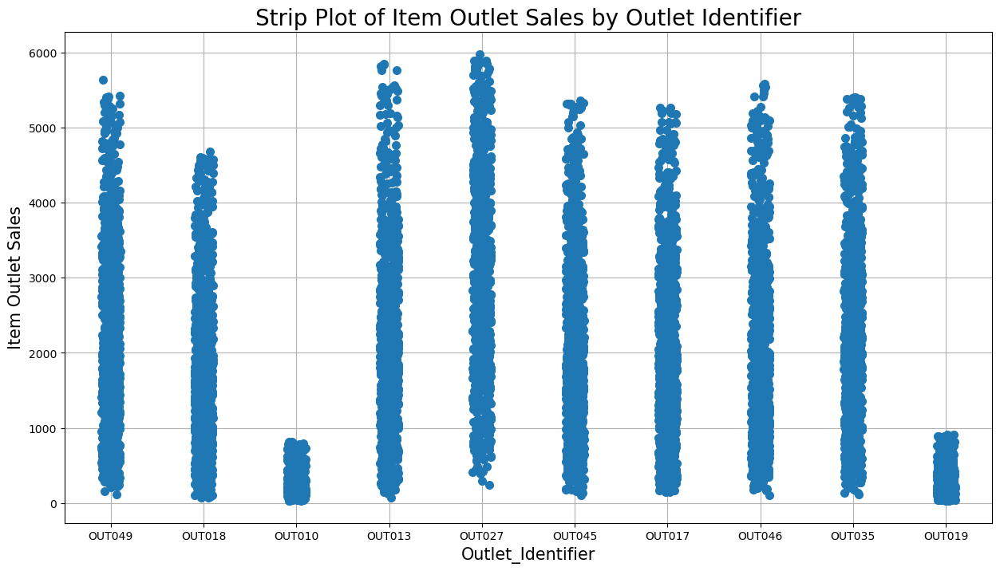

In [156]:
plt.figure(figsize=(15, 8))

# Titre et étiquettes des axes
plt.title('Strip Plot of Item Outlet Sales by Outlet Identifier', fontsize=20)
plt.xlabel('Outlet_Identifier', fontsize=15)
plt.ylabel('Item Outlet Sales', fontsize=15)

# Créer un strip plot avec Seaborn
sns.stripplot(x='Outlet_Identifier', y='Item_Outlet_Sales', data=train_csv, jitter=True, size=8)

# Ajouter une grille
plt.grid(True)

# Afficher le graphique
plt.show()

same for Outlet Identifierthese results are compatible with the barplot 

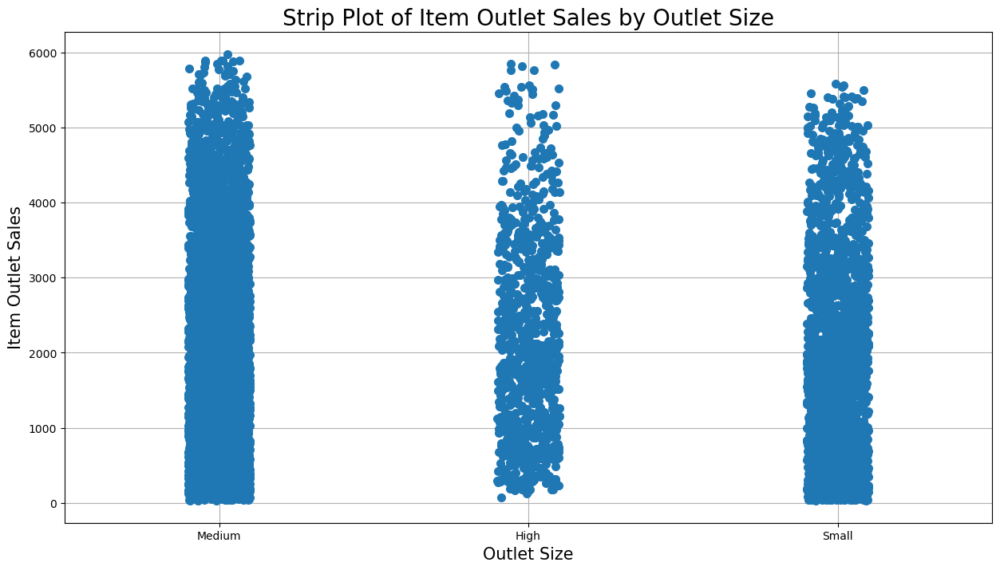

In [158]:
plt.figure(figsize=(15, 8))

# Titre et étiquettes des axes
plt.title('Strip Plot of Item Outlet Sales by Outlet Size', fontsize=20)
plt.xlabel('Outlet Size', fontsize=15)
plt.ylabel('Item Outlet Sales', fontsize=15)

# Créer un strip plot avec Seaborn
sns.stripplot(x='Outlet_Size', y='Item_Outlet_Sales', data=train_csv, jitter=True, size=8)

# Ajouter une grille
plt.grid(True)

# Afficher le graphique
plt.show()

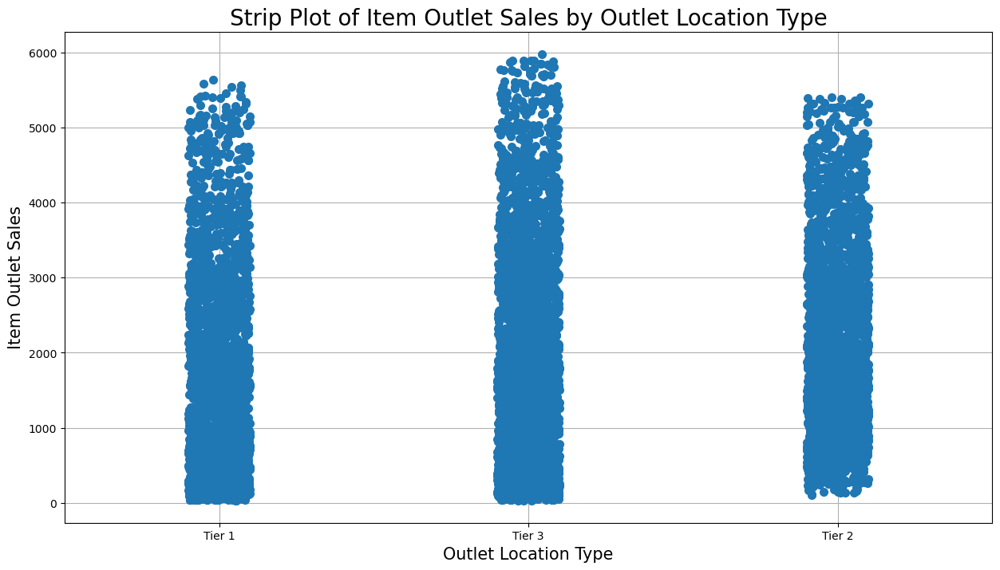

In [159]:
plt.figure(figsize=(15, 8))

# Titre et étiquettes des axes
plt.title('Strip Plot of Item Outlet Sales by Outlet Location Type', fontsize=20)
plt.xlabel('Outlet Location Type', fontsize=15)
plt.ylabel('Item Outlet Sales', fontsize=15)

# Créer un strip plot avec Seaborn
sns.stripplot(x='Outlet_Location_Type', y='Item_Outlet_Sales', data=train_csv, jitter=True, size=8)

# Ajouter une grille
plt.grid(True)

# Afficher le graphique
plt.show()

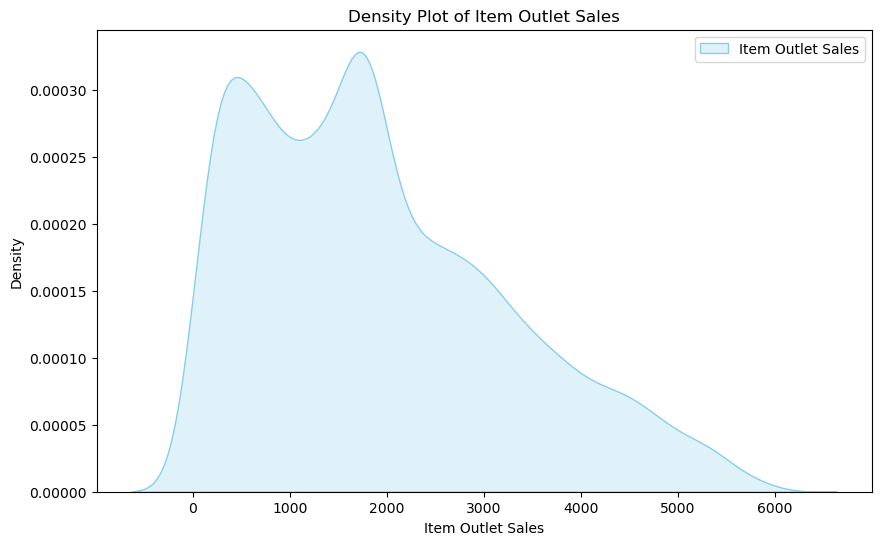

In [162]:
plt.figure(figsize=(10, 6))
sns.kdeplot(train_csv['Item_Outlet_Sales'], fill=True, color='skyblue', label='Item Outlet Sales')
plt.title('Density Plot of Item Outlet Sales')
plt.xlabel('Item Outlet Sales')
plt.ylabel('Density')
plt.legend()
plt.show()

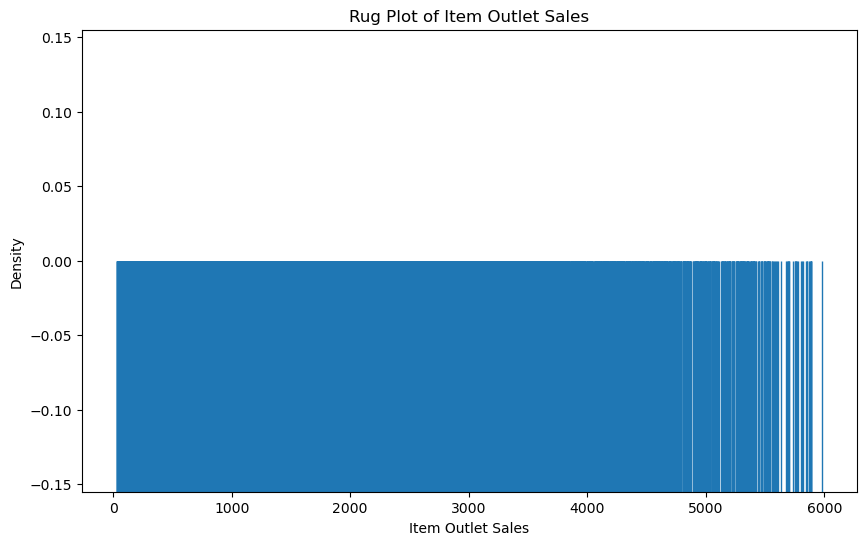

In [163]:
plt.figure(figsize=(10, 6))
sns.rugplot(train_csv['Item_Outlet_Sales'], height=0.5)
plt.title('Rug Plot of Item Outlet Sales')
plt.xlabel('Item Outlet Sales')
plt.ylabel('Density')
plt.show()

In [223]:
missing_data = train_csv.isnull().sum()
print(missing_data)

Item_Identifier                 0
Item_Weight                  1463
Item_Fat_Content                0
Item_Visibility                 0
Item_Type                       0
Item_MRP                        0
Outlet_Identifier               0
Outlet_Establishment_Year       0
Outlet_Size                  2410
Outlet_Location_Type            0
Outlet_Type                     0
Item_Outlet_Sales               0
dtype: int64


In [233]:

# Create an imputer for 'Item_Weight' using mean strategy
item_weight_imputer = SimpleImputer(strategy='mean')
train_csv['Item_Weight'] = item_weight_imputer.fit_transform(train_csv[['Item_Weight']])

# Create an imputer for 'Outlet_Size' using most frequent strategy
outlet_size_imputer = SimpleImputer(strategy='most_frequent')
train_csv['Outlet_Size'] = outlet_size_imputer.fit_transform(train_csv[['Outlet_Size']])

# Save the modified DataFrame to a new CSV file
train_csv.to_csv('train_data_imputed.csv', index=False)

In [234]:
train_csv.isnull().sum()

Item_Identifier              0
Item_Weight                  0
Item_Fat_Content             0
Item_Visibility              0
Item_Type                    0
Item_MRP                     0
Outlet_Identifier            0
Outlet_Establishment_Year    0
Outlet_Size                  0
Outlet_Location_Type         0
Outlet_Type                  0
Item_Outlet_Sales            0
dtype: int64

# label encoding

In [239]:

data['Outlet_Location_Type_Encoded']  = data['Outlet_Location_Type'].replace({'Tier 1': 1, 'Tier 2': 2, 'Tier 3': 3})

print(data[['Outlet_Location_Type', 'Outlet_Location_Type_Encoded']].head())

  Outlet_Location_Type  Outlet_Location_Type_Encoded
0               Tier 1                             1
1               Tier 3                             3
2               Tier 1                             1
3               Tier 3                             3
4               Tier 3                             3


In [240]:
Outlet_Type_Dumm = pd.get_dummies(data=data['Outlet_Type'], columns=['Outlet_Type'], drop_first=True)

pd.concat([data['Outlet_Type'], Outlet_Type_Dumm], axis=1).head()

,Outlet_Type,Supermarket Type1,Supermarket Type2,Supermarket Type3
0,Supermarket Type1,1,0,0
1,Supermarket Type2,0,1,0
2,Supermarket Type1,1,0,0
3,Grocery Store,0,0,0
4,Supermarket Type1,1,0,0


In [54]:
#name of groups
groups = ['Low', 'Med', 'High', 'Exp']

data['Item_MRP_Bin_qcut'] = pd.qcut(data['Item_MRP'], q=4, labels=groups)
data[['Item_MRP', 'Item_MRP_Bin_qcut']].head()

,Item_MRP,Item_MRP_Bin_qcut
0,249.8092,Exp
1,48.2692,Low
2,141.6180,Med
3,182.0950,High
4,53.8614,Low


In [55]:
# Count of each category 
pd.DataFrame(data['Item_MRP_Bin_qcut'].value_counts())

,Item_MRP_Bin_qcut
Low,2131
Med,2131
Exp,2131
High,2130


Balanced Quartiles:

The count of observations in each quartile (Low, Med, Exp, High) is approximately equal. This suggests that the quartiles were defined in a way that distributes the data fairly evenly.
Nearly Equal Distribution:

Each category (Low, Med, Exp, High) contains a similar number of observations (around 2130 or 2131). This suggests that the quartiles were designed to group the data into nearly equal portions, providing a balanced representation of the 'Item_MRP' values.
Uniform Spread:

The equal counts in each category imply that the 'Item_MRP' values are uniformly spread across the quartiles. This uniformity can be useful in certain analyses, as it ensures that each quartile captures a similar range of 'Item_MRP' values.


In [56]:
#define bins 
bins = [0, 70, 140, 210, 280]

#name of groups
groups = ['Low', 'Med', 'High', 'Exp']

data['Item_MRP_Bin_cut'] = pd.cut(data['Item_MRP'], bins=bins, labels=groups)

data[['Item_MRP', 'Item_MRP_Bin_cut']].head()

,Item_MRP,Item_MRP_Bin_cut
0,249.8092,Exp
1,48.2692,Low
2,141.6180,High
3,182.0950,High
4,53.8614,Low


In [58]:
data['Item_Code'] = data['Item_Identifier'].apply(lambda x: x[0:2])
data[['Item_Identifier', 'Item_Code']].head()

,Item_Identifier,Item_Code
0,FDA15,FD
1,DRC01,DR
2,FDN15,FD
3,FDX07,FD
4,NCD19,NC


In [63]:

# Frequency encoding using value_counts function 
Item_Type_freq = data['Item_Type'].value_counts(normalize=True)

# Mapping the encoded values with original data 
data['Item_Type_freq'] = data['Item_Type'].apply(lambda x : Item_Type_freq[x])

print('The sum of Item_Type_freq variable:', sum(Item_Type_freq))
data[['Item_Type', 'Item_Type_freq']].head(6)

The sum of Item_Type_freq variable: 1.0


,Item_Type,Item_Type_freq
0,Dairy,0.080019
1,Soft Drinks,0.052212
2,Meat,0.049865
3,Fruits and Vegetables,0.144550
4,Household,0.106770
5,Baking Goods,0.076030


In [64]:

data['Item_Outlet_Sales_Mean'] = data.groupby(['Item_Identifier', 'Item_Type'])['Item_Outlet_Sales']\
                                     .transform(lambda x: x.mean())

data[['Item_Identifier','Item_Type','Item_Outlet_Sales','Item_Outlet_Sales_Mean']].tail()

,Item_Identifier,Item_Type,Item_Outlet_Sales,Item_Outlet_Sales_Mean
8518,FDF22,Snack Foods,2778.3834,3232.542225
8519,FDS36,Baking Goods,549.2850,2636.568000
8520,NCJ29,Health and Hygiene,1193.1136,1221.521067
8521,FDN46,Snack Foods,1845.5976,2067.752867
8522,DRG01,Soft Drinks,765.6700,1225.072000


In [65]:
import category_encoders as ce

train_df=pd.DataFrame({'Item_Fat_Content':['Low Fat','Regular','LF','reg' ]})

# create object of Ordinalencoding
encoder= ce.OrdinalEncoder(cols=['Item_Fat_Content'],return_df=True,
                           mapping=[{'col':'Degree',
'mapping':{'None':0,'Low Fat':1,'Regular':2,'LF':3,'reg':4}}])

#Original data
print(train_df)


  Item_Fat_Content
0          Low Fat
1          Regular
2               LF
3              reg


In [244]:
import pandas as pd

# Sample DataFrame
train_df = pd.DataFrame({'Item_Fat_Content': ['Low Fat',  'reg']})

# Perform one-hot encoding
one_hot_encoded = pd.get_dummies(train_df['Item_Fat_Content'], prefix='city')

# Display the one-hot encoded data
one_hot_encoded



,city_Low Fat,city_reg
0,1,0
1,0,1


In [250]:
train_df=pd.DataFrame({'Item_Fat_Content': ['Low Fat', 'Regular'],'Marks':[70,97]})

#Create target encoding object
encoder=ce.TargetEncoder(cols='Item_Fat_Content') 

#Original Data
train_df

,Item_Fat_Content,Marks
0,Low Fat,70
1,Regular,97


# Exploring Feature Importance in Predicting Item Outlet Sales with RandomForestRegressor

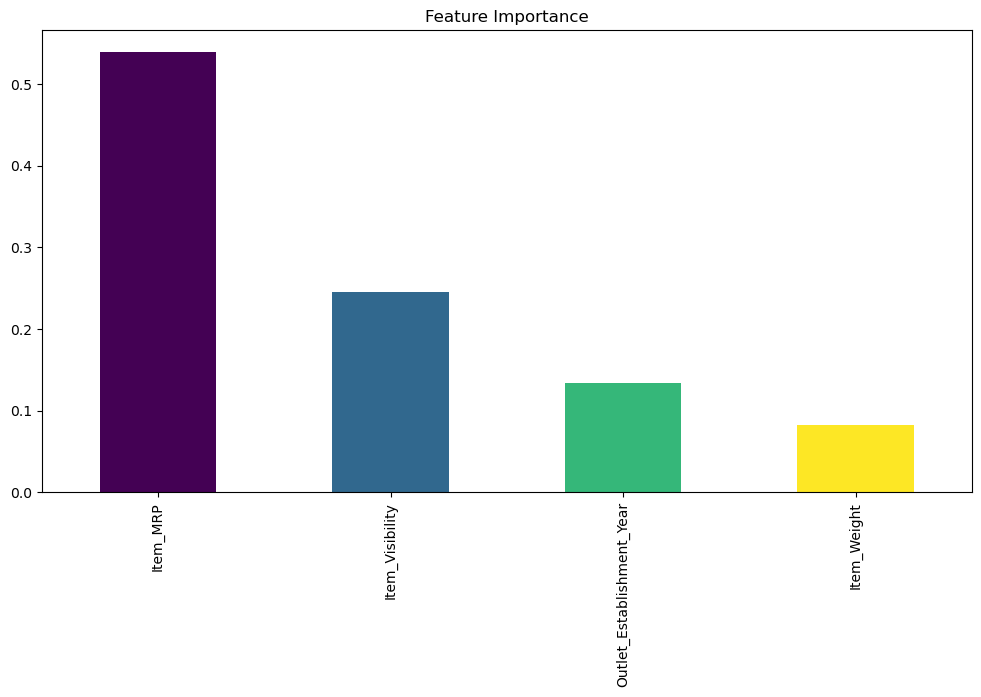

In [267]:
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestRegressor

# Select numeric columns
numeric_columns = train_csv.select_dtypes(include=['int64', 'float64']).columns

# Extract features and target
X_train = train_csv[numeric_columns].drop('Item_Outlet_Sales', axis=1)
y_train = train_csv['Item_Outlet_Sales']

# Impute missing values with the mean
imputer = SimpleImputer(strategy='mean')
X_train_imputed = imputer.fit_transform(X_train)

# Create and fit the RandomForestRegressor
rf_model = RandomForestRegressor()
rf_model.fit(X_train_imputed, y_train)

# Display feature importance with different colors
feature_importance = pd.Series(rf_model.feature_importances_, index=X_train.columns)
feature_importance.sort_values(ascending=False, inplace=True)

# Generate distinct colors for each feature
colors = plt.cm.viridis(np.linspace(0, 1, len(feature_importance)))

# Plotting with colored bars
feature_importance.plot(kind='bar', figsize=(12, 6), color=colors)
plt.title('Feature Importance')
plt.show()


# Evaluating Linear Regression Model for Predicting Item Outlet Sales

In [271]:
from sklearn.impute import SimpleImputer
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_absolute_error, mean_squared_error
from sklearn.model_selection import train_test_split


X_train, X_test, y_train, y_test = train_test_split(X_train_imputed, y_train, test_size=0.2, random_state=42)

# Initialize Linear Regression model
LR = LinearRegression()

# Fit the model to the imputed training data
LR.fit(X_train, y_train)

# Predict on the test set
pred_LR = LR.predict(X_test)

# Evaluate the model
r2_test = r2_score(y_test, pred_LR)
mae = mean_absolute_error(y_test, pred_LR)
mse = mean_squared_error(y_test, pred_LR)
rmse = mean_squared_error(y_test, pred_LR, squared=False)

# Print evaluation metrics
print('R2 Score on test data:', r2_test)
print('Mean Absolute Error:', mae)
print('Mean Squared Error:', mse)
print('Root Mean Squared Error:', rmse)

R2 Score on test data: 0.33946511245938027
Mean Absolute Error: 997.5241718641931
Mean Squared Error: 1795314.0522914473
Root Mean Squared Error: 1339.8932988456384


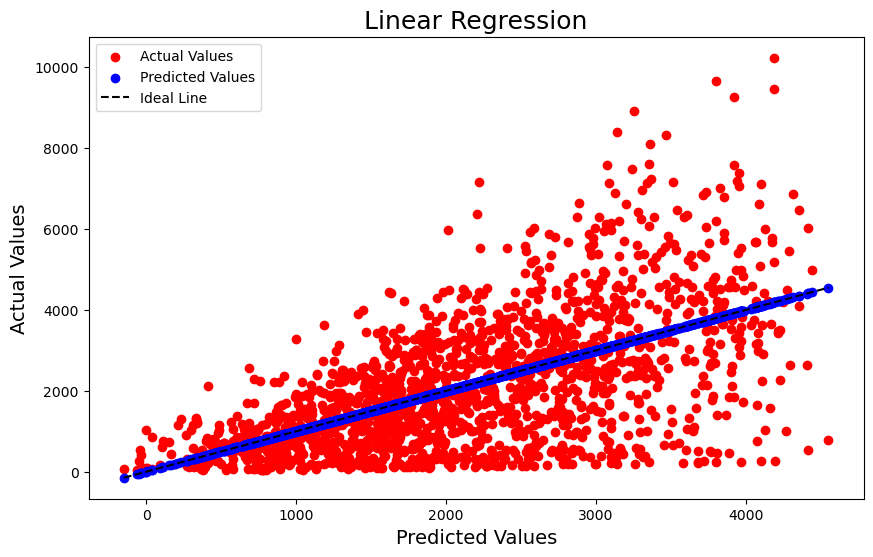

In [274]:
import matplotlib.pyplot as plt

# Scatter plot of actual vs predicted values
plt.figure(figsize=(10, 6))

# Plotting actual values in red
plt.scatter(x=pred_LR, y=y_test, color='r', label='Actual Values')

# Plotting predicted values in blue
plt.scatter(x=pred_LR, y=pred_LR, color='b', label='Predicted Values')

# Adding a line representing the ideal scenario where actual equals predicted
plt.plot([min(pred_LR), max(pred_LR)], [min(pred_LR), max(pred_LR)], color='black', linestyle='--', label='Ideal Line')

plt.xlabel('Predicted Values', fontsize=14)
plt.ylabel('Actual Values', fontsize=14)
plt.title("Linear Regression", fontsize=18)
plt.legend()
plt.show()


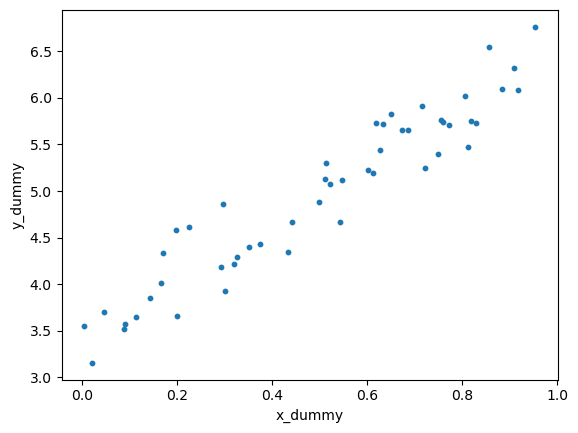

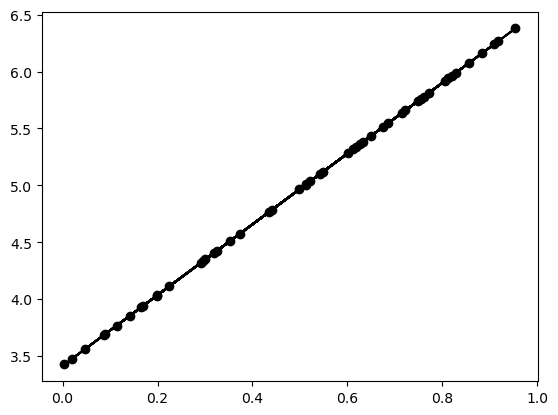

In [277]:
# creating a dummy dataset
np.random.seed(10)
x = np.random.rand(50, 1)
y = 3 + 3 * x + np.random.rand(50, 1)
#scatterplot

plt.scatter(x,y,s=10)
plt.xlabel('x_dummy')
plt.ylabel('y_dummy')
plt.show()




regressor = LinearRegression()
regressor.fit(x, y)
pred = regressor.predict(x)
#model performance
from sklearn.metrics import r2_score, mean_squared_error
mse = mean_squared_error(y, pred)
r2 = r2_score(y, pred)#Best fit lineplt.scatter(x, y)
plt.plot(x, pred, color = 'Black', marker = 'o')

# Linear Regression Analysis and Model Summary using Statsmodels

In [278]:
import statsmodels.api as sm

#adding a constant
X = sm.add_constant(x)

#performing the regression
result = sm.OLS(y, x).fit()

# Result of statsmodels 
print(result.summary())

                                 OLS Regression Results                                
Dep. Variable:                      y   R-squared (uncentered):                   0.892
Model:                            OLS   Adj. R-squared (uncentered):              0.890
Method:                 Least Squares   F-statistic:                              405.8
Date:                Sun, 04 Feb 2024   Prob (F-statistic):                    2.35e-25
Time:                        23:48:29   Log-Likelihood:                         -96.258
No. Observations:                  50   AIC:                                      194.5
Df Residuals:                      49   BIC:                                      196.4
Df Model:                           1                                                  
Covariance Type:            nonrobust                                                  
                 coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------

# Analysis Conclusion:

This linear regression analysis reveals that the model has an uncentered coefficient of determination (R-squared) of 0.892, indicating that 89.2% of the variance in the dependent variable (y) can be explained by the independent variable (x1). The model is statistically significant with an F-statistic of 405.8, and the associated p-value is virtually zero (Prob (F-statistic): 2.35e-25), suggesting overall significance. The coefficient associated with the independent variable (x1) is 8.3493, with a confidence interval of [7.516, 9.182]. This implies that a one-unit increase in x1 is associated with an average increase of 8.3493 in the dependent variable. Additional results, such as Omnibus, Durbin-Watson, Jarque-Bera, provide insights into the model's quality and error distribution.

In [279]:
from scipy.linalg import lstsq

class LinearRegression():
    """
    Class representing a linear regression model.
    Models relationship between target variable and attributes by computing 
    line that minimizes mean squared error.
    Parameters
    ----------   
    solver : {'lstsq'}, 
        Optimization method used to minimize mean squared error in training.
        'lstsq' : 
            Ordinary lease squares method using scipy.linalg.lstsq.
    Attributes 
    ----------
    coef_ : array of shape (n_features, 1)
        Estimated coefficients for the regression problem.
    Notes
    -----
    This class is capable of being trained using ordinary least squares method.
    See solver parameter above.
    """
    def __init__(self, solver='lstsq'):
        self.solver = solver 

    def fit(self, X, y):
        """
        Fit linear regression model.
 
        If solver='lstsq' model is trained using ordinary least squares.
        Parameters
        ----------
        X : array-like of shape (n_samples, n_features)
            Training data. Independent variables.
        y : array-like of shape (n_samples, 1)
            Target values. Dependent variable.
        Returns
        -------
        self : returns an instance of self.
        """
        # If solver is 'lstsq' use ordinary least squares optimization method.
        if self.solver == 'lstsq':
            # Make sure inputs are numpy arrays.
            X = np.array(X)
            y = np.array(y)
            # Add x_0 = 1 to each instance for the bias term.
            X = np.c_[np.ones((X.shape[0], 1)), X]
            # Scipy implementation of least squares.
            self.coef_, residues, rank, singular = lstsq(X, y)

            return self
          
    def predict(self, X):
        """
        Estimate target values using the linear model.
        Parameters
        ----------
        X : array-like of shape (n_samples, n_features)
            Instances.
        Returns
        -------
        C : array of shape (n_samples, 1)
            Estimated targets per instance.
        """
        # Make sure inputs are numpy arrays.
        X = np.array(X)
        # Add x_0 = 1 to each instance for the bias term.
        X = np.c_[np.ones((X.shape[0], 1)), X]

        return X.dot(self.coef_)
    
     #Créer une instance de la classe LinearRegression
model = LinearRegression()

# Entraîner le modèle sur les données d'entraînement X_train, y_train
model.fit(X_train, y_train)

# Faire des prédictions sur de nouvelles données X_test
predictions = model.predict(X_test)
print("Prédictions :", predictions)

Prédictions : [1565.86643531  662.37304484  742.33483262 ...  914.36351422  281.5730315
 1700.38223491]


In [282]:
# Code you have previously used to load data
import pandas as pd
from sklearn.tree import DecisionTreeRegressor

# Path of the file to read
iowa_file_path = 'train.csv'

home_data = pd.read_csv(iowa_file_path)
# Update the target variable to 'Item_Outlet_Sales'
y = home_data['Item_Outlet_Sales']
# Update the feature columns
feature_columns = ['Item_Weight', 'Item_Visibility', 'Item_MRP']
X = home_data[feature_columns]

# Specify Model
iowa_model = DecisionTreeRegressor()
# Fit Model
iowa_model.fit(X, y)

print("First in-sample predictions:", iowa_model.predict(X.head()))
print("Actual target values for those homes:", y.head().tolist())




First in-sample predictions: [3890.83456626 1357.9173878  1357.9173878  2667.8743952  1357.9173878 ]
Actual target values for those homes: [3735.138, 443.4228, 2097.27, 732.38, 994.7052]
